# PARCIAL 3

### PUNTO 4

In [116]:


import matplotlib.pyplot as plt
import numpy as np
from numpy import linalg as LA
import random
import networkx as nx
import pandas as pd


- Construccion Grafo G1 (aleatorio de Erdös-Rényi)

In [298]:
n=101
m=231
seed = 20160 
G1 = nx.gnm_random_graph(n, m, seed=seed)
print('El numero de nodos en G1 es:',G1.number_of_nodes())
print('El numero de aristas en G1 es:',G1.number_of_edges())

El numero de nodos en G1 es: 101
El numero de aristas en G1 es: 231


El numero de nodos en G1 es: 101
El numero de aristas en G1 es: 231


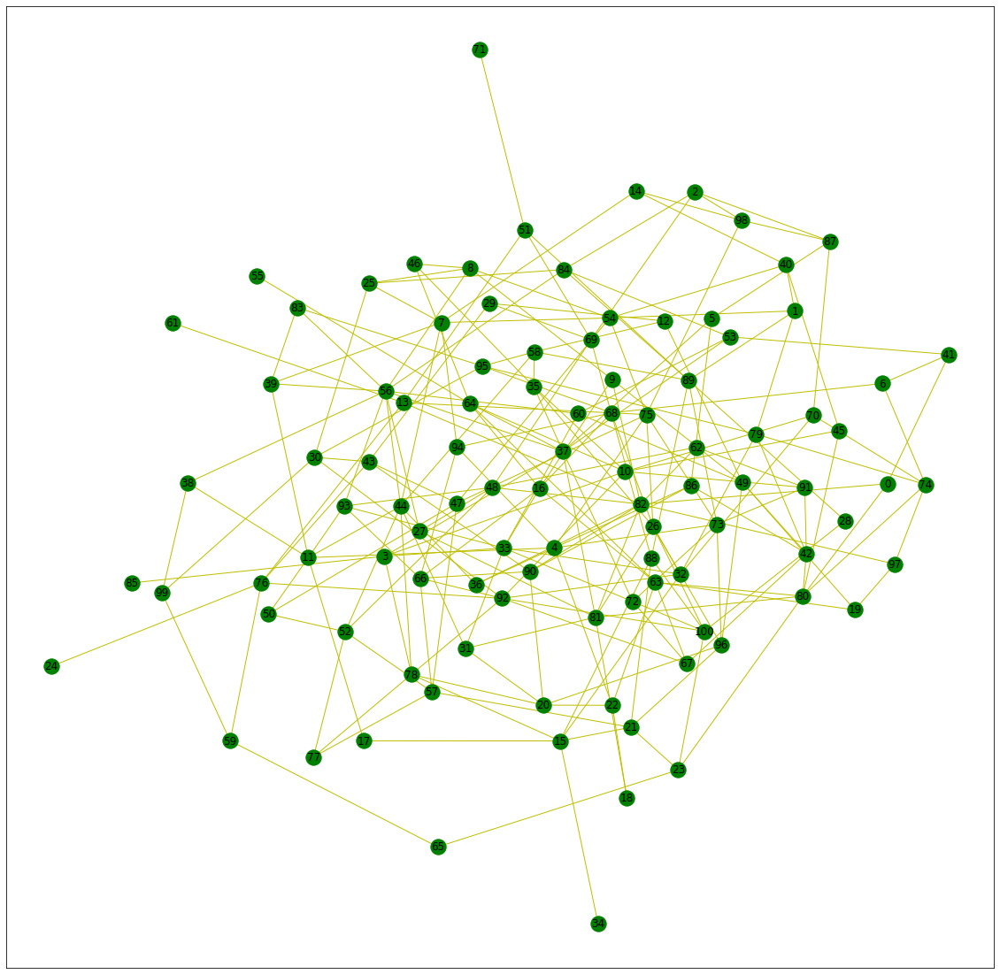

In [297]:
erdos_renyi_graph= nx.erdos_renyi_graph(101,0.05)
print('El numero de nodos en G1 es:',erdos_renyi_graph.number_of_nodes())
print('El numero de aristas en G1 es:',erdos_renyi_graph.number_of_edges())
plt.figure(figsize=(20,20))
nx.draw_networkx(erdos_renyi_graph, with_labels = True, node_color= 'g', edge_color='y')

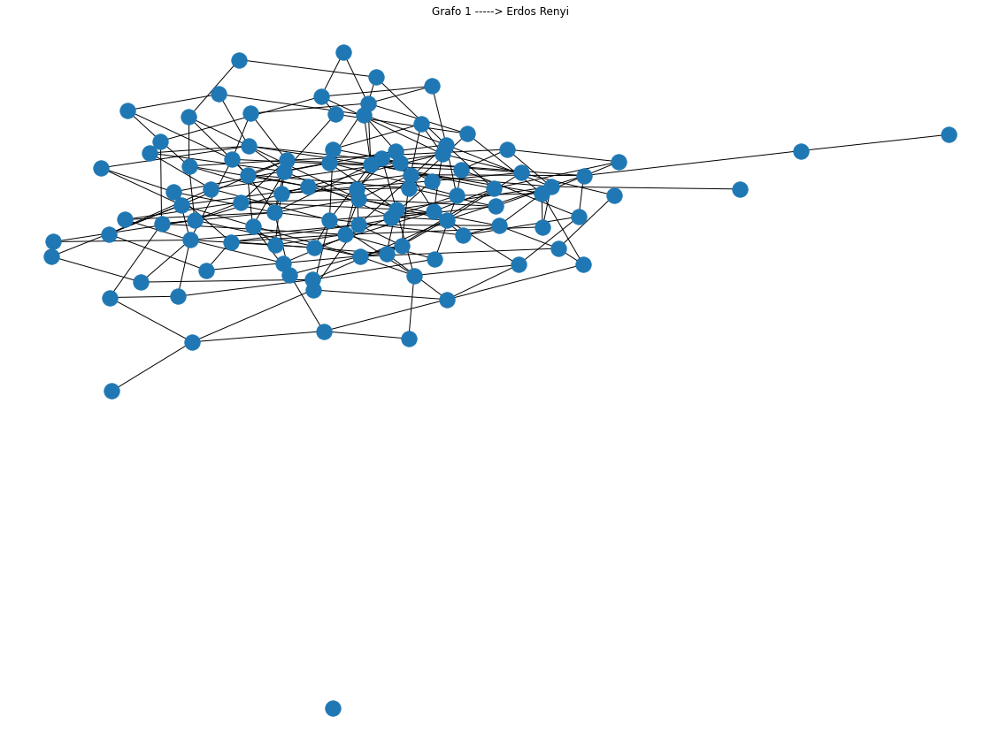

In [299]:
pos = nx.spring_layout(G1, seed=seed)  # Seed for reproducible layout
plt.figure(figsize=(20,15))
plt.title('Grafo 1 -----> Erdos Renyi')
nx.draw(G1, pos=pos)
plt.show()

- Construccion Grafo G2 (ley de potencias en la distribución de los grados)

In [300]:
G2 = nx.barabasi_albert_graph(n,m, seed=seed)
print('El numero de nodos en G2 es:',G2.number_of_nodes())
print('El numero de aristas en G2 es:',G2.number_of_edges())

NetworkXError: Barabási–Albert network must have m >= 1 and m < n, m = 231, n = 101

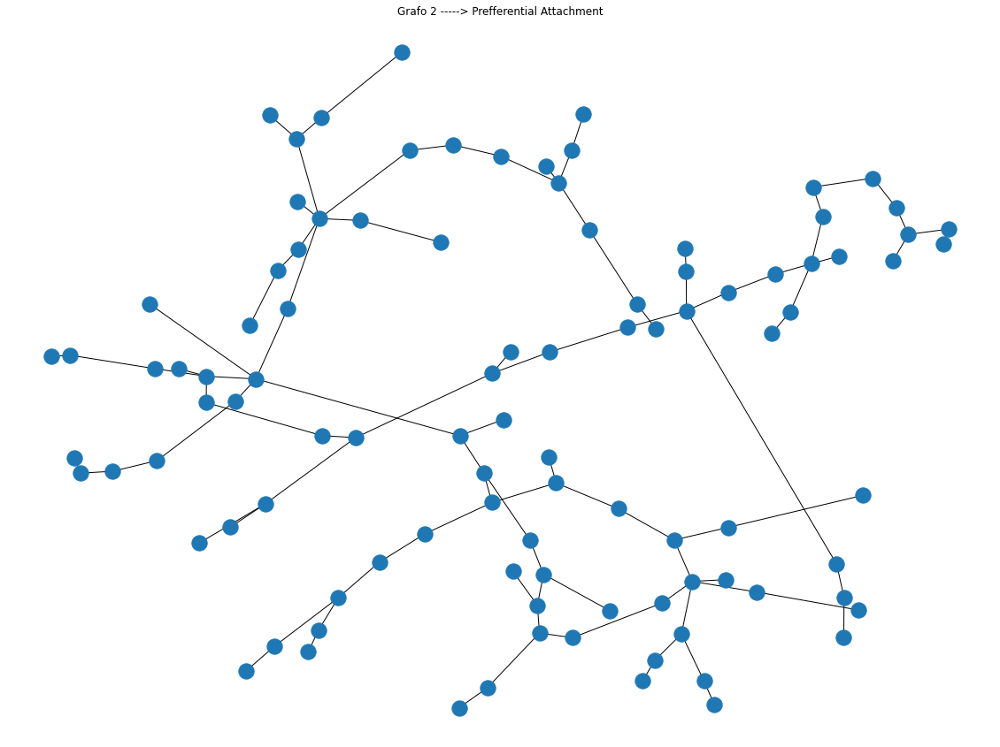

In [301]:
pos = nx.spring_layout(G2, seed=seed)  # Seed for reproducible layout
plt.figure(figsize=(20,15))
plt.title('Grafo 2 -----> Prefferential Attachment')
nx.draw(G2, pos=pos)
plt.show()

### SIMULACION 1

In [302]:
def alfa_preferential_attachment(grafo, x_m):
    """
    Calcula por maxima verosimilitud el valor del exponente de la ley de potencias a la que corresponde un grafo.
    :param grafo:
    :param x_m: valor a partir del cual se empieza a cumplir la ley de potencias
    :return: alfa
    """
    sumatoria = 0
    for v in grafo:
        cant_ady = len(list(grafo.neighbors(v)))
        if cant_ady >= x_m:
            sumatoria += np.log(cant_ady / x_m)
    return 1 + len(grafo) / sumatoria

In [303]:
print(alfa_preferential_attachment(G2, 0.39))

1.65622191415888


In [304]:
def elegir_preferntial(grafo, banned):
    grados_entrada = [0] * len(grafo)
    total = 0
    for v in range(len(grafo)):
        for w in grafo.neighbors(v):
            if w in banned:
                continue
            grados_entrada[w] += 1
            total += 1
    if total == 0:
        return None

    aleat = random.uniform(0, total)
    sumando = 0
    for i in range(len(grafo)):
        sumando += grados_entrada[i]
        if sumando > aleat:
            return i


def preferential_attachment(dirigido, alfa, cant, k):
    p = 1 - (1/(alfa - 1))
    valores = list(range(cant))
    g = nx.DiGraph() if dirigido else nx.Graph()
    g.add_nodes_from(valores)
    for v in range(cant):
        banned = set([v])
        for i in range(int(k)):
            preferential = random.uniform(0, 1) < p
            ya_agregado = False
            if preferential and v > 0:
                w = elegir_preferntial(g, banned)
                if w is not None:
                    banned.add(w)
                    g.add_edge(v, w)
                    ya_agregado = False
            if not ya_agregado:
                w = random.choice(list(set(range(cant)) - set([v])))
                g.add_edge(v, w)

    return g

In [341]:
pref_graph = preferential_attachment(False, 2, 101, 3.4)
print(pref_graph.edges)
print(len(pref_graph.edges))
print(pref_graph.nodes)


[(0, 41), (0, 27), (0, 29), (0, 5), (0, 22), (0, 31), (0, 65), (0, 90), (1, 49), (1, 41), (1, 20), (2, 55), (2, 37), (2, 62), (2, 93), (3, 53), (3, 56), (3, 58), (3, 14), (3, 25), (3, 72), (4, 47), (4, 87), (4, 54), (4, 6), (4, 7), (4, 80), (4, 95), (4, 96), (5, 14), (5, 52), (5, 38), (5, 49), (5, 68), (6, 48), (6, 47), (6, 17), (6, 44), (6, 70), (7, 20), (7, 74), (7, 35), (7, 57), (8, 23), (8, 74), (8, 14), (8, 50), (8, 64), (9, 67), (9, 87), (9, 56), (9, 29), (9, 34), (9, 54), (10, 18), (10, 81), (10, 77), (10, 24), (10, 97), (11, 97), (11, 66), (11, 49), (11, 24), (11, 55), (11, 77), (11, 82), (12, 42), (12, 79), (12, 58), (12, 37), (12, 74), (13, 95), (13, 16), (13, 17), (14, 99), (14, 88), (14, 30), (14, 65), (15, 89), (15, 52), (15, 49), (15, 27), (15, 91), (16, 80), (16, 42), (16, 88), (16, 27), (16, 58), (17, 30), (17, 67), (17, 41), (18, 60), (18, 20), (18, 56), (18, 31), (18, 35), (18, 100), (19, 61), (19, 82), (19, 27), (19, 87), (20, 95), (20, 92), (20, 47), (20, 55), (20, 

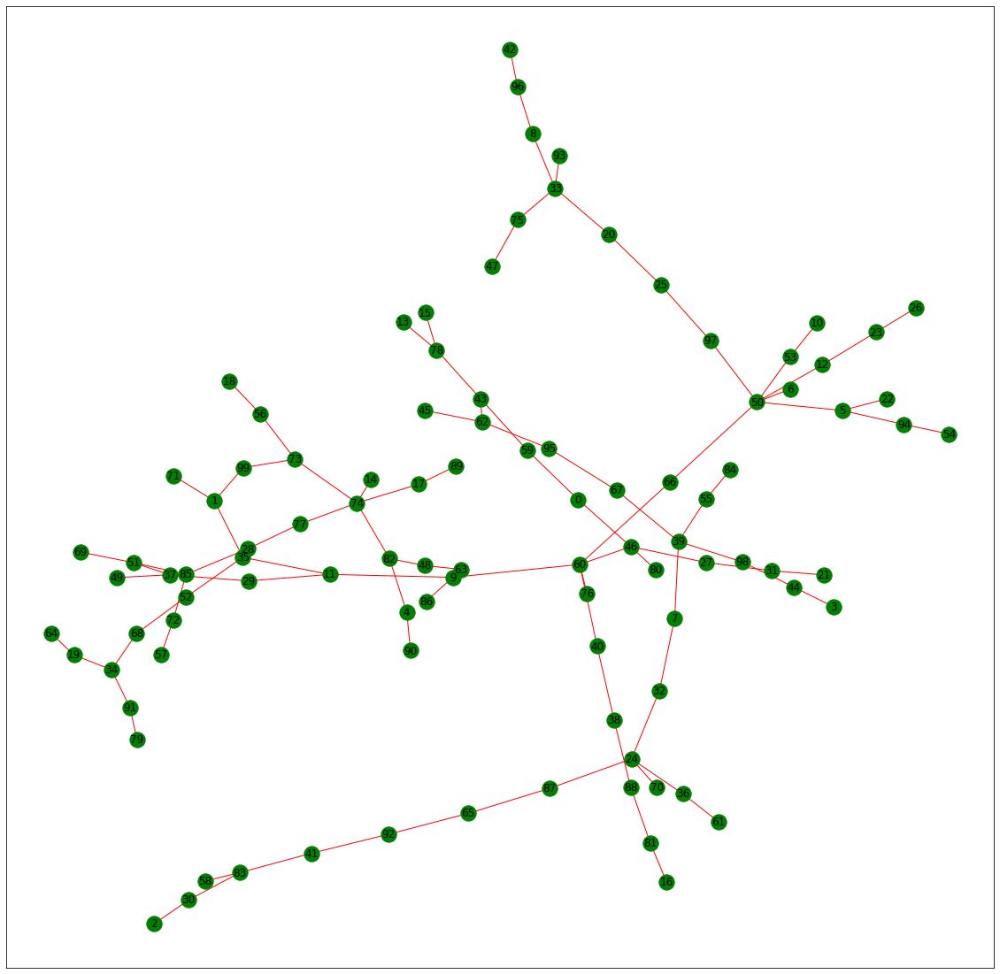

In [198]:
plt.figure(figsize=(20,20))
nx.draw_networkx(pref_graph, with_labels = True, node_color= 'g', edge_color='r')

(-1.0273029253496875,
 1.069460727816664,
 -1.0996917765210898,
 1.0935273069428861)

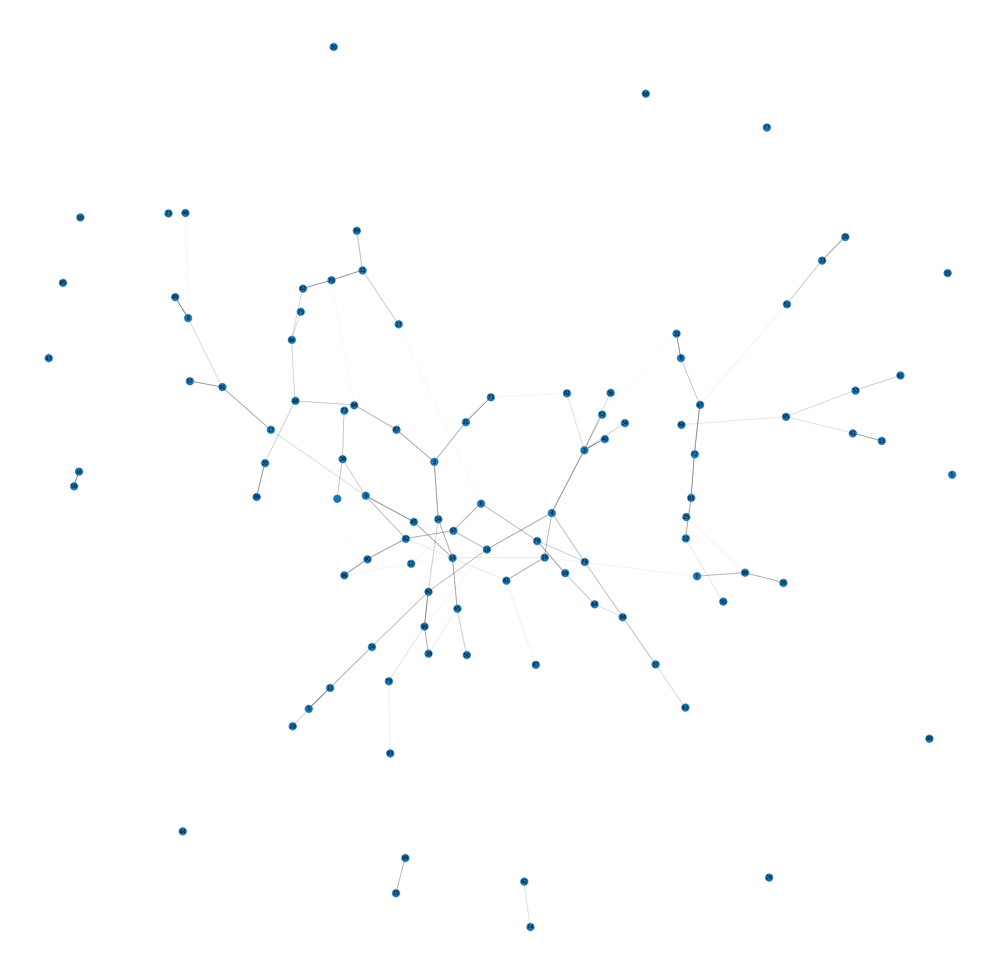

In [276]:
import random
E = G1.number_of_edges()
#initializing random weights
w = [random.random() for i in range(E)]
s = max(w)
w = [ i/s for i in w ] #normalizing
len(w)
k = 0
for i, j in G1.edges():
    G1[i][j]['weight'] = w[k]
    k+=1
import matplotlib.pyplot as plt
edgewidth = [d['weight'] for (u,v,d) in G1.edges(data=True)]
# layout
#pos = nx.spring_layout(G, iterations=50)
pos = nx.spring_layout(G1)
labels = {}
for i in range(100):
    labels[i] = i
# rendering
plt.figure(figsize=(40,40))
nx.draw_networkx_nodes(G1, pos)
nx.draw_networkx_edges(G1, pos, width=edgewidth, node_size=500)
nx.draw_networkx_labels(G1, pos, labels)
plt.axis('off')

(-0.9027966708933518,
 0.9454381138499057,
 -0.9862188098137404,
 1.0945818480863685)

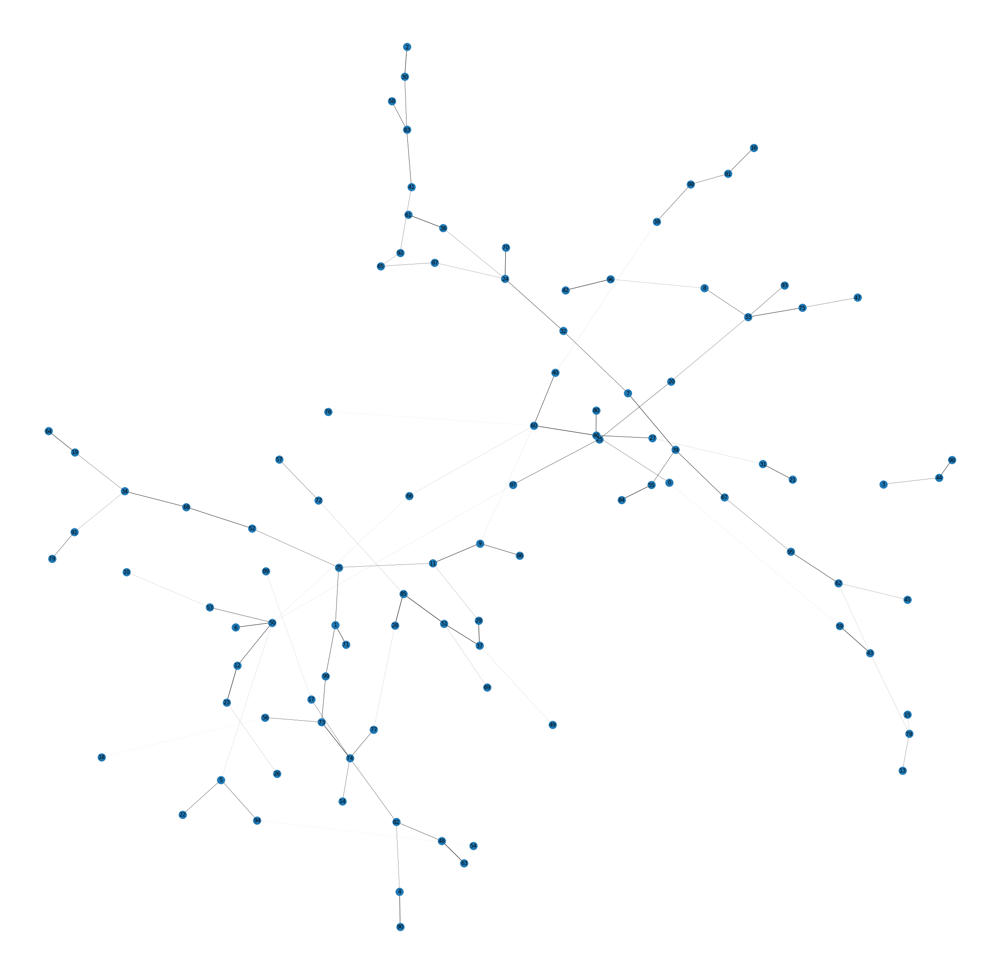

In [277]:
E = G2.number_of_edges()
#initializing random weights
w = [random.random() for i in range(E)]
s = max(w)
w = [ i/s for i in w ] #normalizing
len(w)
k = 0
for i, j in G2.edges():
    G2[i][j]['weight'] = w[k]
    k+=1
import matplotlib.pyplot as plt
edgewidth = [d['weight'] for (u,v,d) in G2.edges(data=True)]
# layout
#pos = nx.spring_layout(G, iterations=50)
pos = nx.spring_layout(G2)
labels = {}
for i in range(100):
    labels[i] = i
# rendering
plt.figure(figsize=(40,40))
nx.draw_networkx_nodes(G2, pos)
nx.draw_networkx_edges(G2, pos, width=edgewidth, node_size=500)
nx.draw_networkx_labels(G2, pos, labels)
plt.axis('off')

5.999999999999999
doing Gillespie simulation
done with simulation, now plotting


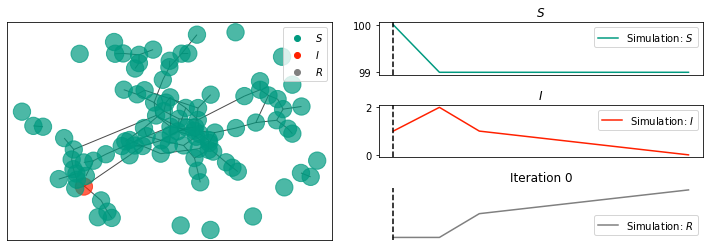

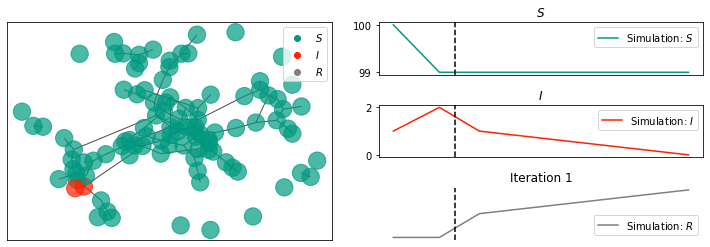

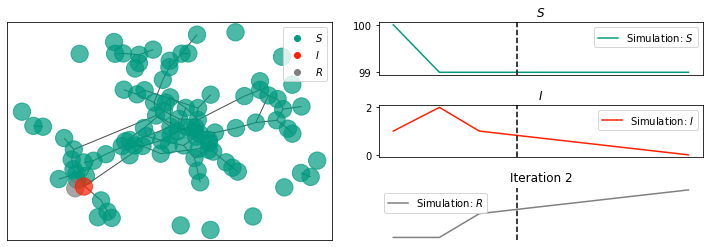

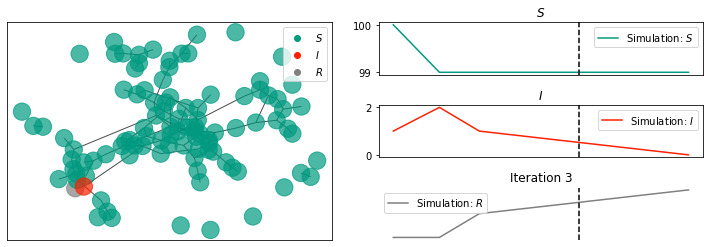

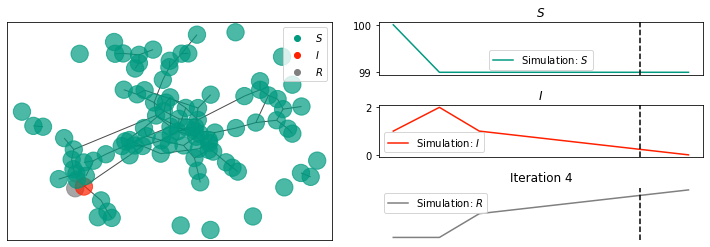

In [278]:
import EoN
gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)
N = 100 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(G1)
nx_kwargs = { "pos": pos, "alpha": 0.7} #optional arguments to be passed on to the
#networkx plotting command.
print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G1, tau = beta, gamma=gamma, rho = I0/N, transmission_weight="weight", return_full_data=True)
print("done with simulation, now plotting")
for i in range(0,5,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

(<AxesSubplot:>,
 [<AxesSubplot:title={'center':'$S$'}>,
  <AxesSubplot:title={'center':'$I$'}>,
  <AxesSubplot:title={'center':'$R$'}, xlabel='$t$'>])

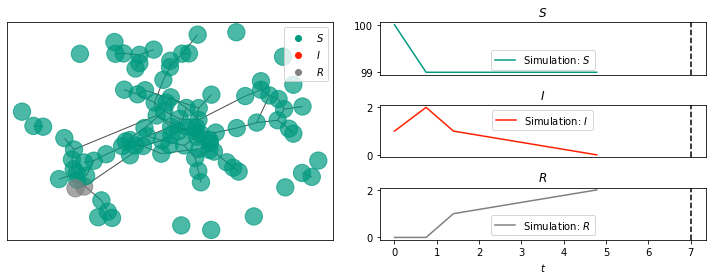

In [279]:
sim.display(time = 7,  **nx_kwargs)



5.999999999999999
doing Gillespie simulation
done with simulation, now plotting


/Users/paulabruck/opt/anaconda3/lib/python3.9/site-packages/EoN/simulation_investigation.py:861: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,4))


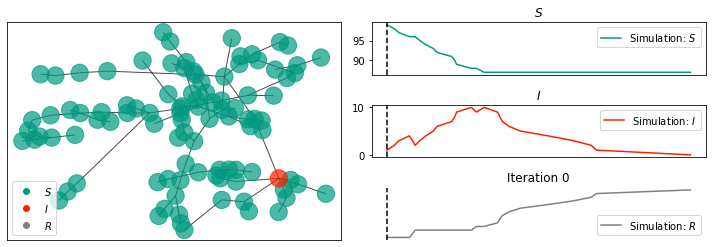

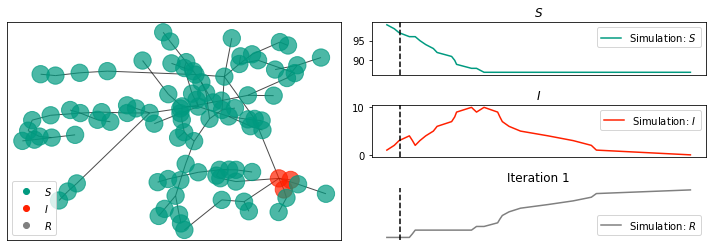

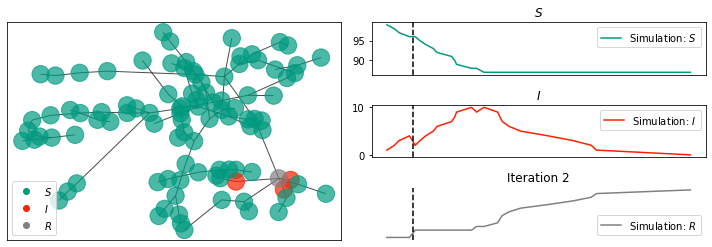

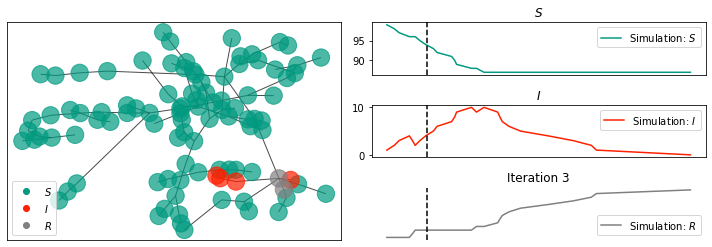

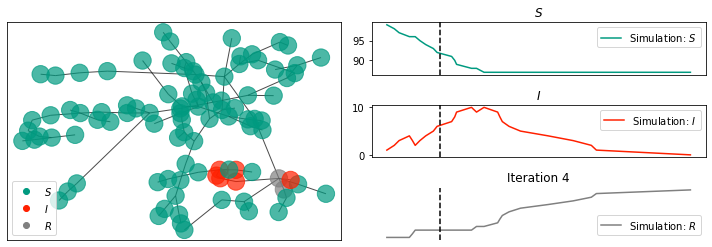

...

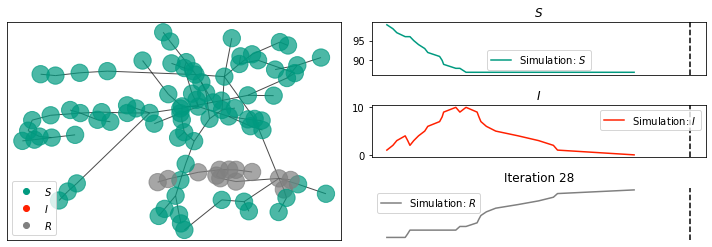

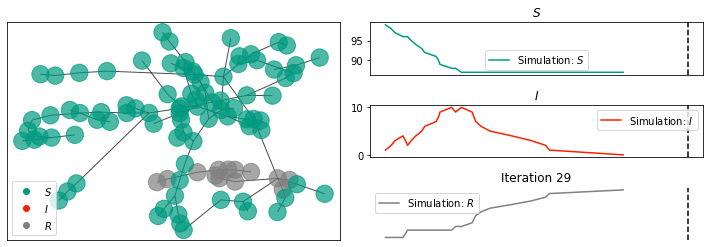

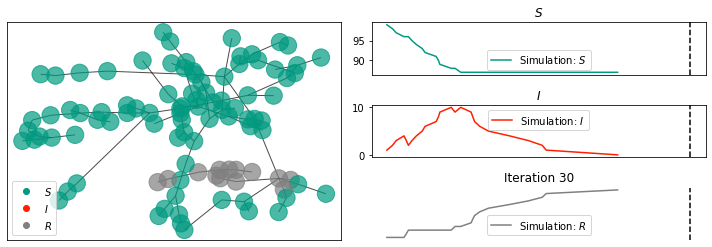

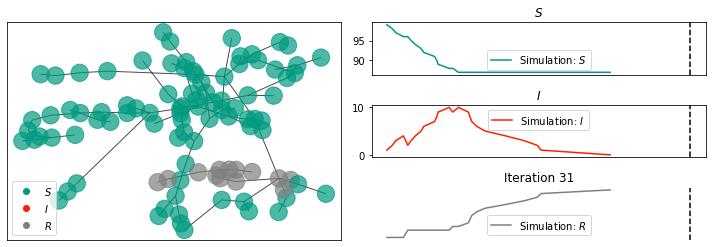

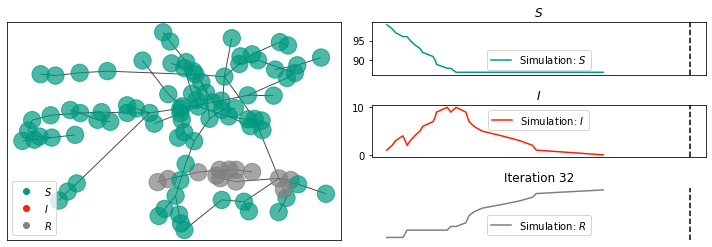

In [280]:
gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)
N = 102 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(G2)
nx_kwargs = { "pos": pos, "alpha": 0.7} #optional arguments to be passed on to the
#networkx plotting command.
print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G2, tau = beta, gamma=gamma, rho = I0/N,tmin=0, tmax=33, transmission_weight="weight", return_full_data=True)
print("done with simulation, now plotting")
for i in range(0,33,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

5.999999999999999
doing Gillespie simulation
done with simulation, now plotting


/Users/paulabruck/opt/anaconda3/lib/python3.9/site-packages/EoN/simulation_investigation.py:861: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,4))


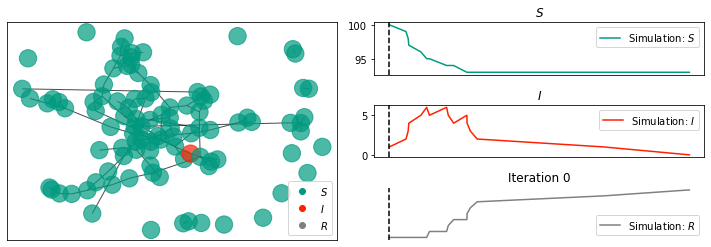

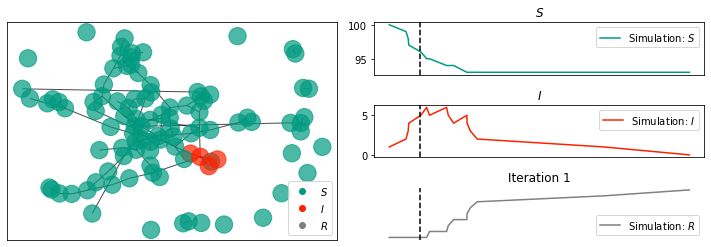

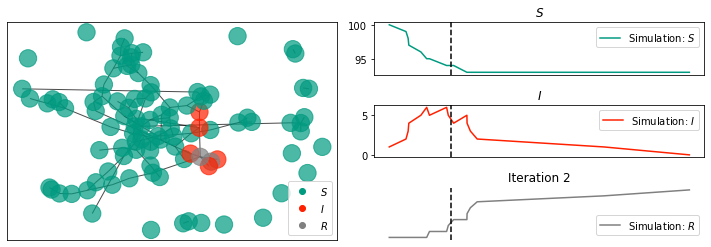

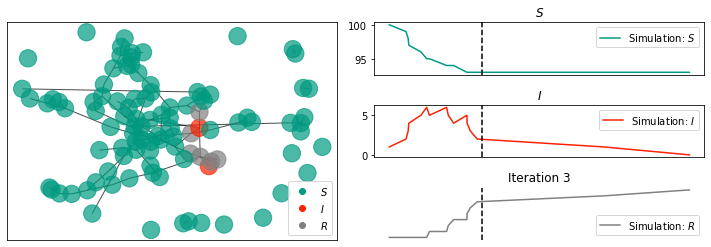

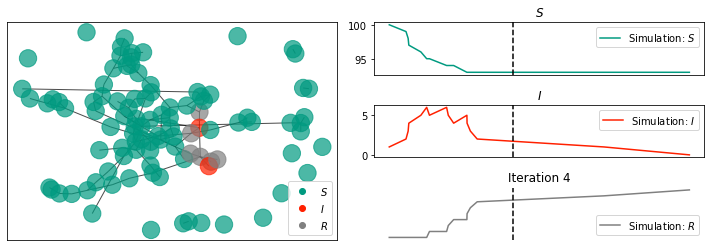

...

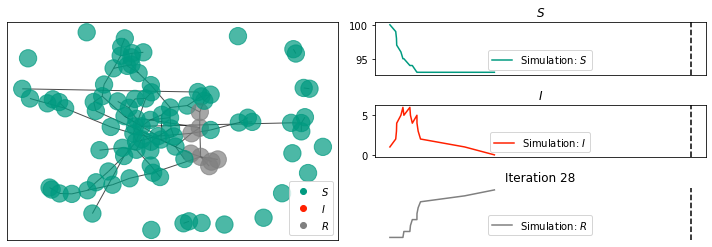

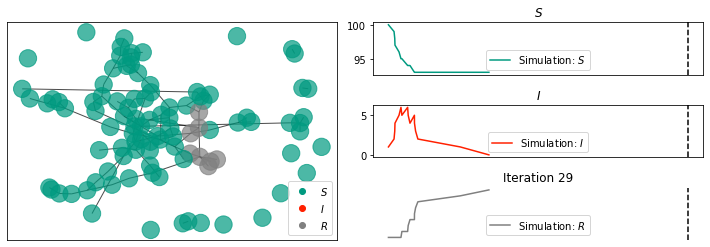

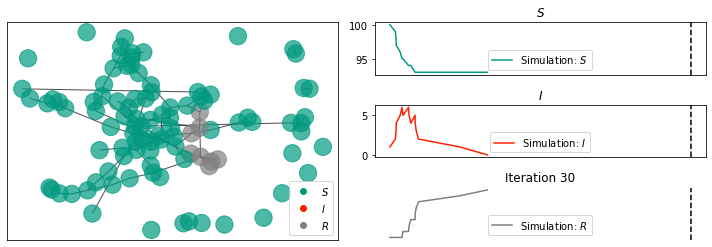

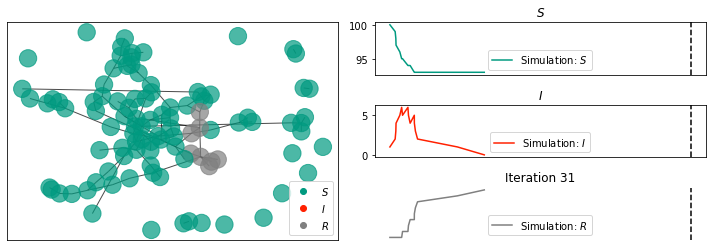

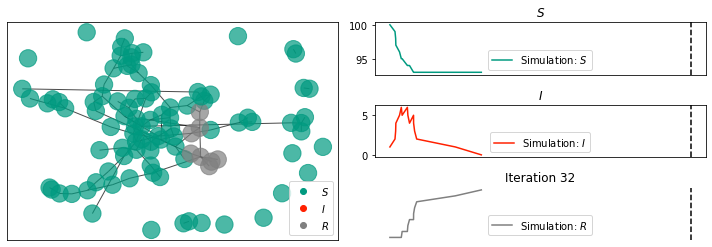

In [242]:
gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)
N = 102 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(G1)
nx_kwargs = { "pos": pos, "alpha": 0.7} #optional arguments to be passed on to the
#networkx plotting command.
print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G1, tau = beta, gamma=gamma, rho = I0/N,tmin=0, tmax=33, transmission_weight="weight", return_full_data=True)
print("done with simulation, now plotting")
for i in range(0,33,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

doing Gillespie simulation
done with simulation, now plotting


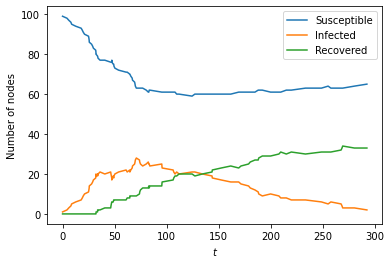

In [247]:
from collections import defaultdict

# parameters required for the SIRS model
a = 0.1
b = 0.01
y = 0.001
d = 0.001

# Simple contagions
# the below is based on an example of a SEIR disease (there is an exposed state before becoming infectious)
# from https://arxiv.org/pdf/2001.02436.pdf



H = nx.DiGraph() #For the spontaneous transitions
H.add_edge('I', 'R', rate = b)  # an infected node can be recovered/removed
H.add_edge('I', 'S', rate = y)  # an infected node can become susceptible again
H.add_edge('R', 'S', rate = d)  # a recovered node can become suscepticle again

J = nx.DiGraph() #for the induced transitions
J.add_edge(('I', 'S'),('I', 'I'), rate = a)  # a susceptible node can become infected from a neighbour
IC = defaultdict(lambda: 'S')

# set all statuses except one to susceptible. only one node shall begin infected
for node in range(102):
    IC[node] = 'S'
IC[0] = 'I'

return_statuses = ('S', 'I', 'R')
print('doing Gillespie simulation')

t, S, I, R = EoN.Gillespie_simple_contagion(G2, H, J, IC, return_statuses, tmax = 300)

print('done with simulation, now plotting')
plt.plot(t, S, label = 'Susceptible')
plt.plot(t, I, label = 'Infected')
plt.plot(t, R, label = 'Recovered')
plt.xlabel('$t$')
plt.ylabel('Number of nodes')
plt.legend()
plt.show()

doing Gillespie simulation
done with simulation, now plotting


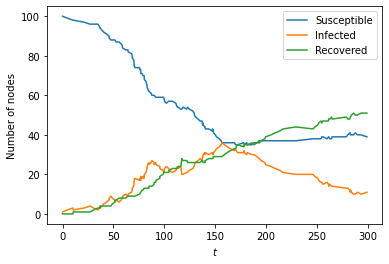

In [246]:
# parameters required for the SIRS model
a = 0.1
b = 0.01
y = 0.001
d = 0.001

# Simple contagions
# the below is based on an example of a SEIR disease (there is an exposed state before becoming infectious)
# from https://arxiv.org/pdf/2001.02436.pdf



H = nx.DiGraph() #For the spontaneous transitions
H.add_edge('I', 'R', rate = b)  # an infected node can be recovered/removed
H.add_edge('I', 'S', rate = y)  # an infected node can become susceptible again
H.add_edge('R', 'S', rate = d)  # a recovered node can become suscepticle again

J = nx.DiGraph() #for the induced transitions
J.add_edge(('I', 'S'),('I', 'I'), rate = a)  # a susceptible node can become infected from a neighbour
IC = defaultdict(lambda: 'S')

# set all statuses except one to susceptible. only one node shall begin infected
for node in range(102):
    IC[node] = 'S'
IC[0] = 'I'

return_statuses = ('S', 'I', 'R')
print('doing Gillespie simulation')

t, S, I, R = EoN.Gillespie_simple_contagion(G1, H, J, IC, return_statuses, tmax = 300)

print('done with simulation, now plotting')
plt.plot(t, S, label = 'Susceptible')
plt.plot(t, I, label = 'Infected')
plt.plot(t, R, label = 'Recovered')
plt.xlabel('$t$')
plt.ylabel('Number of nodes')
plt.legend()
plt.show()

In [252]:

import networkx as nx
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep

# Network topology
g = nx.erdos_renyi_graph(1000, 0.1)

# Model selection
model = ep.SIRModel(g)

# Model Configuration
cfg = mc.Configuration()
cfg.add_model_parameter('beta', 0.01)
cfg.add_model_parameter('gamma', 0.005)
cfg.add_model_parameter("fraction_infected", 0.05)
model.set_initial_status(cfg)

# Simulation execution
iterations = model.iteration_bunch(200)
print(iterations)

[{'iteration': 0, 'status': {0: 0, 1: 0, 2: 0, 3: 0, 4: 1, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 1, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 0, 19: 0, 20: 0, 21: 0, 22: 0, 23: 0, 24: 0, 25: 0, 26: 0, 27: 0, 28: 0, 29: 1, 30: 0, 31: 0, 32: 0, 33: 0, 34: 0, 35: 1, 36: 0, 37: 0, 38: 0, 39: 0, 40: 0, 41: 0, 42: 0, 43: 0, 44: 0, 45: 0, 46: 0, 47: 0, 48: 0, 49: 0, 50: 0, 51: 0, 52: 0, 53: 0, 54: 0, 55: 0, 56: 0, 57: 0, 58: 0, 59: 0, 60: 0, 61: 0, 62: 0, 63: 0, 64: 0, 65: 0, 66: 0, 67: 0, 68: 0, 69: 0, 70: 0, 71: 0, 72: 0, 73: 1, 74: 0, 75: 0, 76: 0, 77: 0, 78: 0, 79: 0, 80: 0, 81: 0, 82: 0, 83: 0, 84: 0, 85: 0, 86: 0, 87: 0, 88: 0, 89: 0, 90: 0, 91: 0, 92: 0, 93: 0, 94: 0, 95: 0, 96: 0, 97: 0, 98: 0, 99: 0, 100: 0, 101: 0, 102: 0, 103: 0, 104: 0, 105: 1, 106: 0, 107: 0, 108: 0, 109: 0, 110: 0, 111: 0, 112: 0, 113: 0, 114: 0, 115: 0, 116: 0, 117: 0, 118: 0, 119: 0, 120: 0, 121: 0, 122: 0, 123: 0, 124: 0, 125: 0, 126: 0, 127: 0, 128: 0, 129: 0, 130: 0, 131: 0, 132: 0, 133: 0, 134: 0, 1

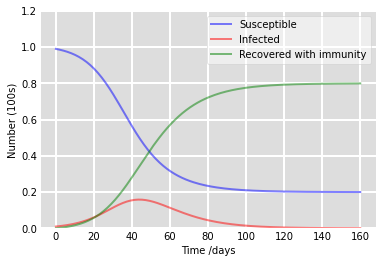

In [256]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt

# Total population, N.
N = 100
# Initial number of infected and recovered individuals, I0 and R0.
I0, R0 = 1, 0
# Everyone else, S0, is susceptible to infection initially.
S0 = N - I0 - R0
# Contact rate, beta, and mean recovery rate, gamma, (in 1/days).
beta, gamma = 0.2, 1./10 
# A grid of time points (in days)
t = np.linspace(0, 160, 160)

# The SIR model differential equations.
def deriv(y, t, N, beta, gamma):
    S, I, R = y
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I
    dRdt = gamma * I
    return dSdt, dIdt, dRdt

# Initial conditions vector
y0 = S0, I0, R0
# Integrate the SIR equations over the time grid, t.
ret = odeint(deriv, y0, t, args=(N, beta, gamma))
S, I, R = ret.T

# Plot the data on three separate curves for S(t), I(t) and R(t)
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111, facecolor='#dddddd', axisbelow=True)
ax.plot(t, S/100, 'b', alpha=0.5, lw=2, label='Susceptible')
ax.plot(t, I/100, 'r', alpha=0.5, lw=2, label='Infected')
ax.plot(t, R/100, 'g', alpha=0.5, lw=2, label='Recovered with immunity')
ax.set_xlabel('Time /days')
ax.set_ylabel('Number (100s)')
ax.set_ylim(0,1.2)
ax.yaxis.set_tick_params(length=0)
ax.xaxis.set_tick_params(length=0)
ax.grid(b=True, which='major', c='w', lw=2, ls='-')
legend = ax.legend()
legend.get_frame().set_alpha(0.5)
for spine in ('top', 'right', 'bottom', 'left'):
    ax.spines[spine].set_visible(False)
plt.show()

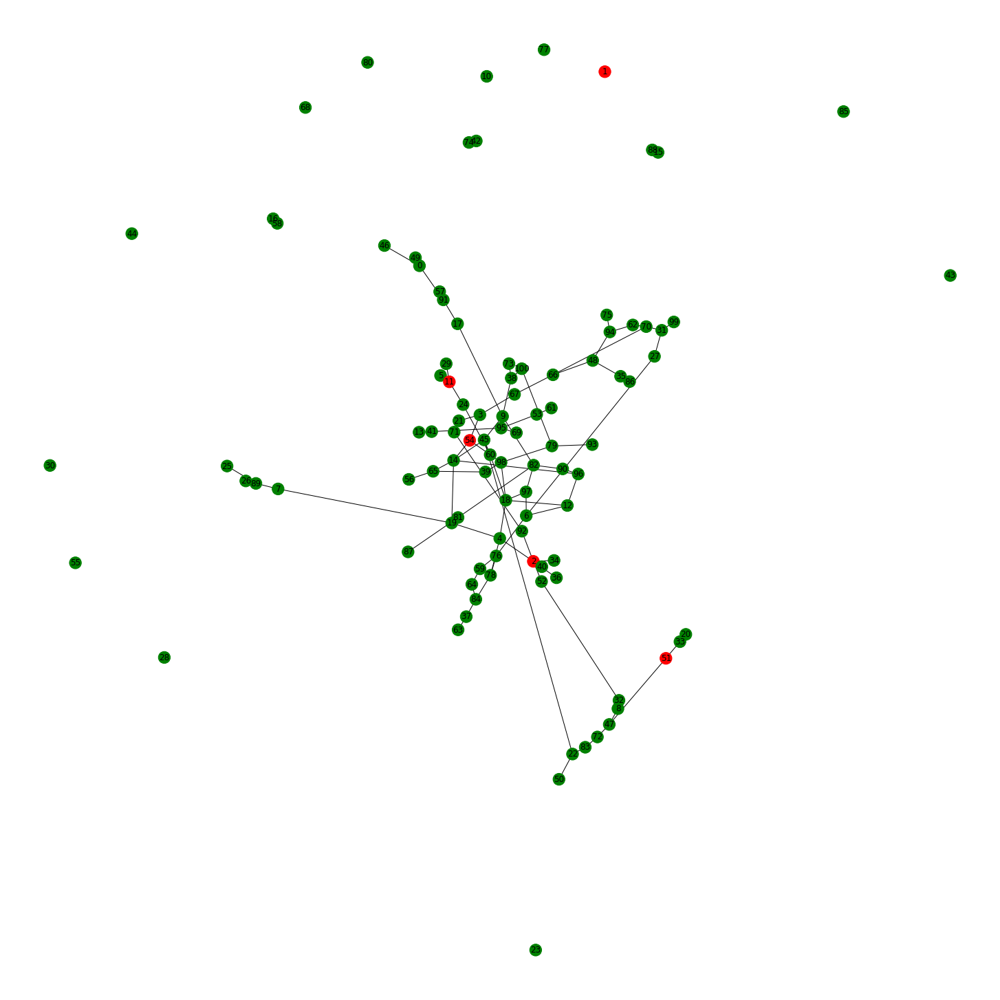

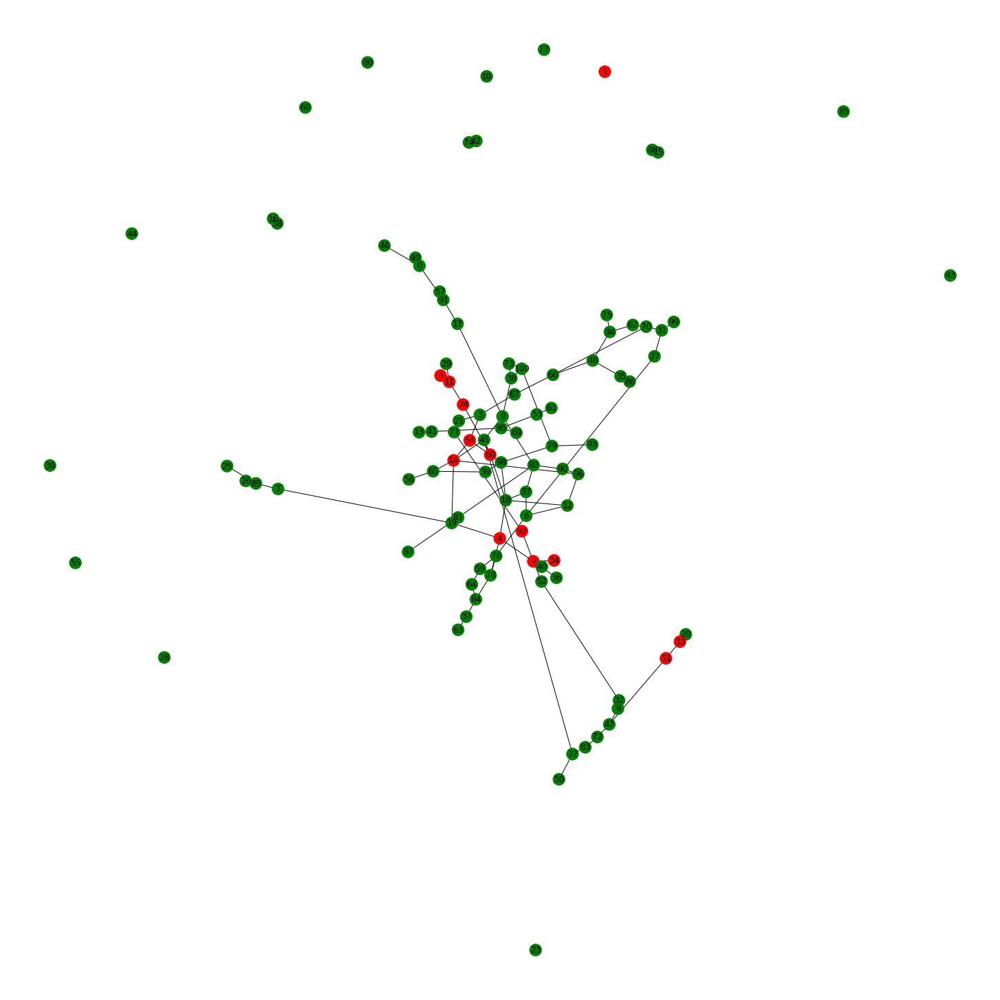

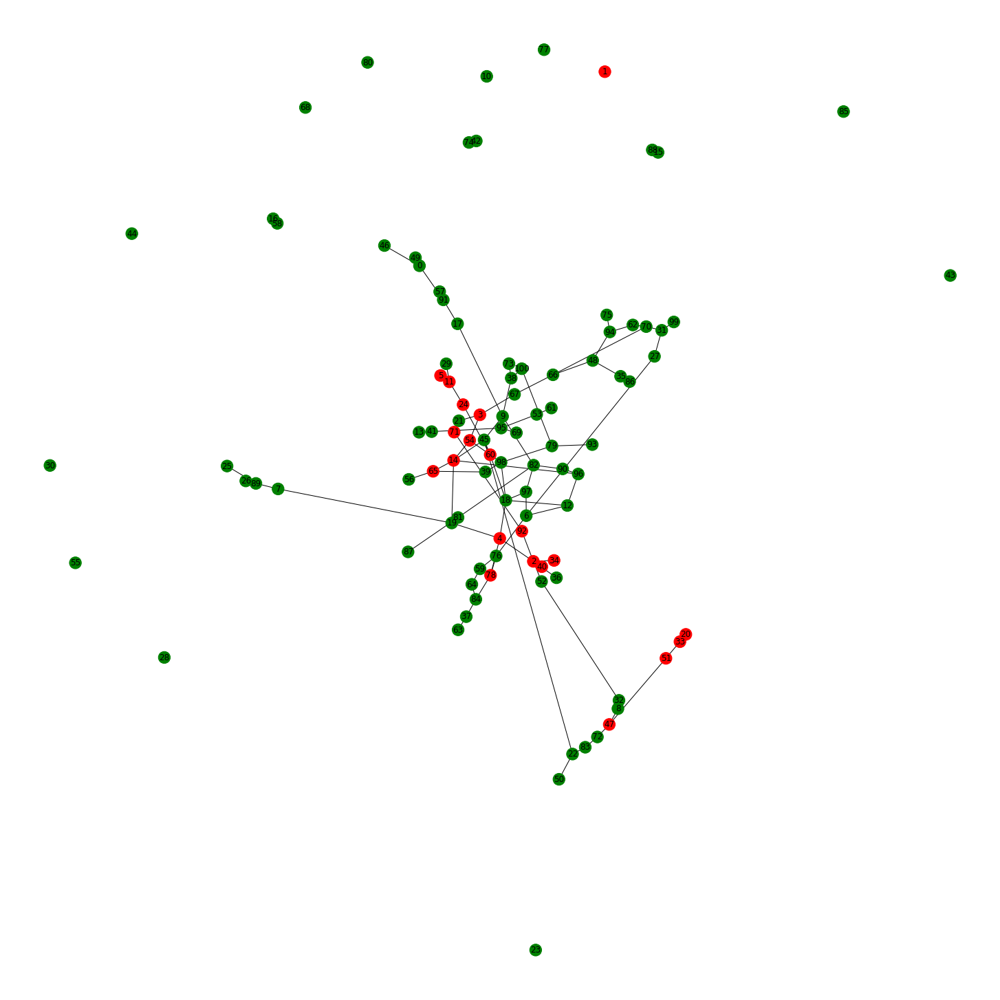

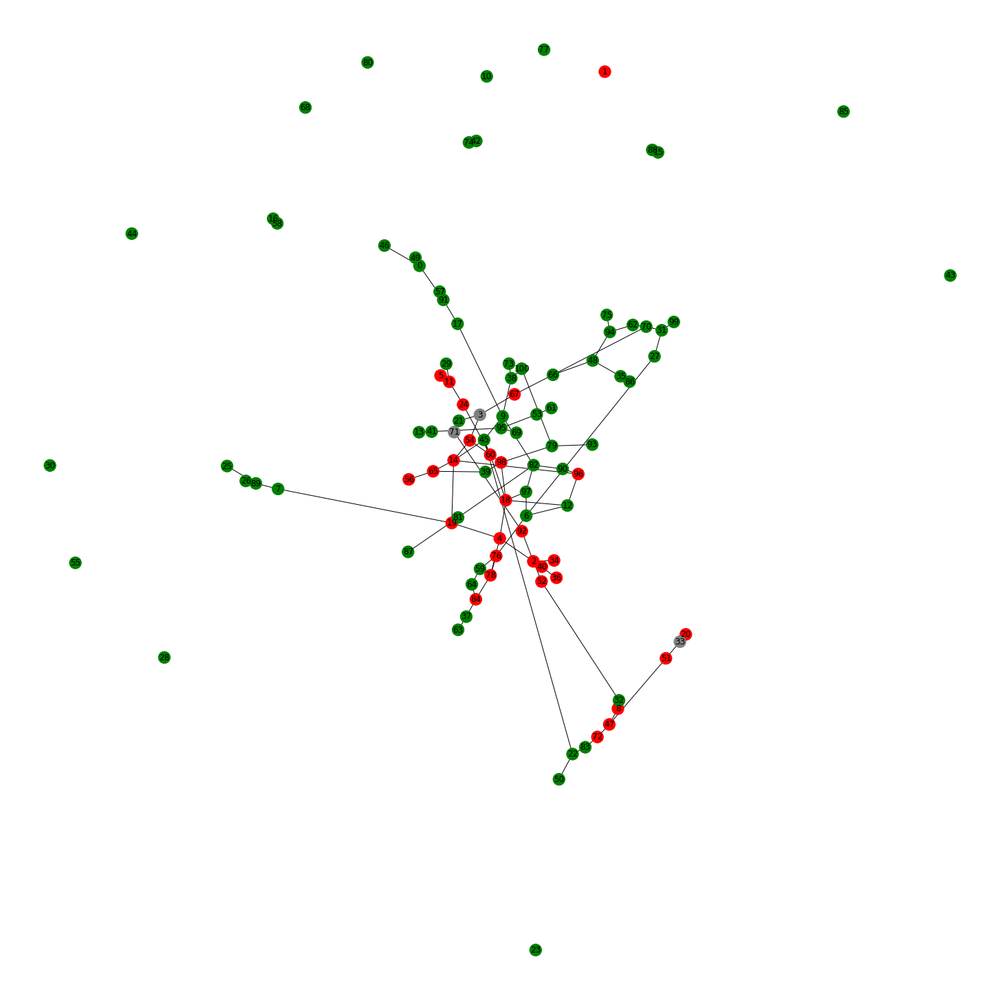

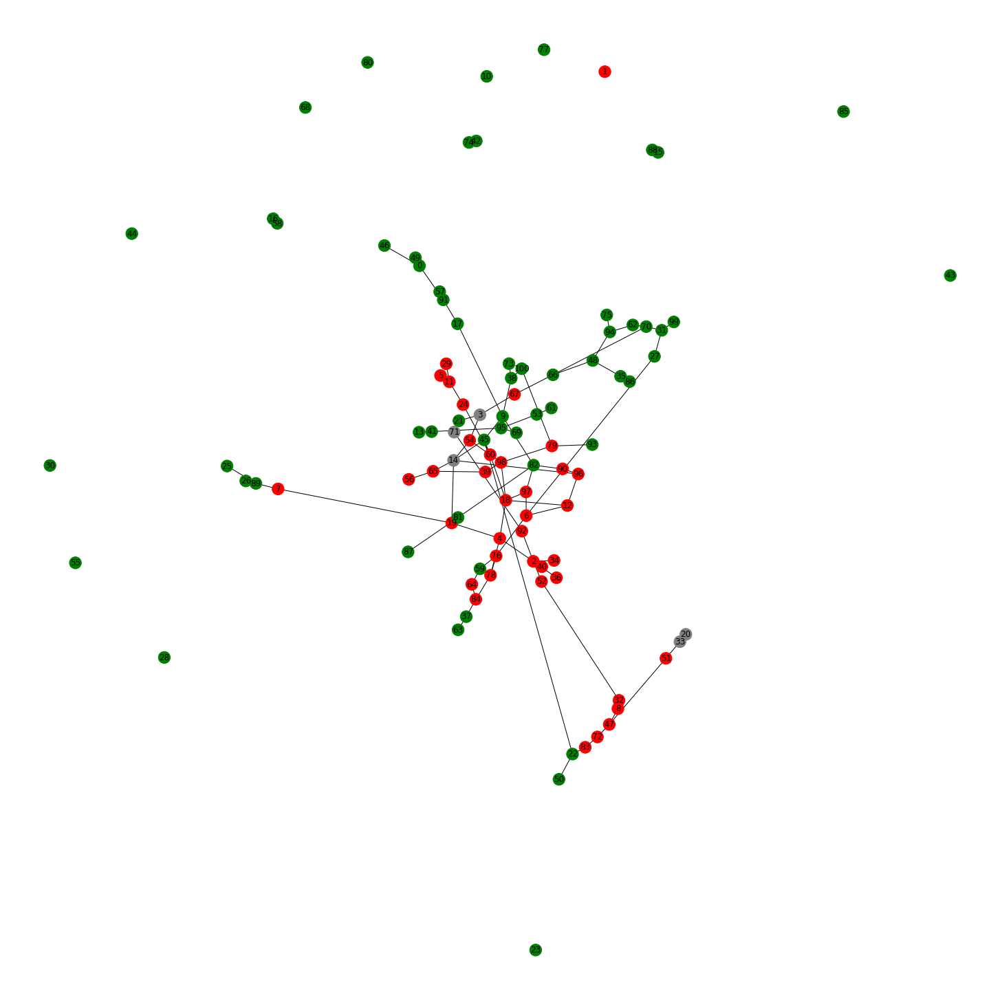

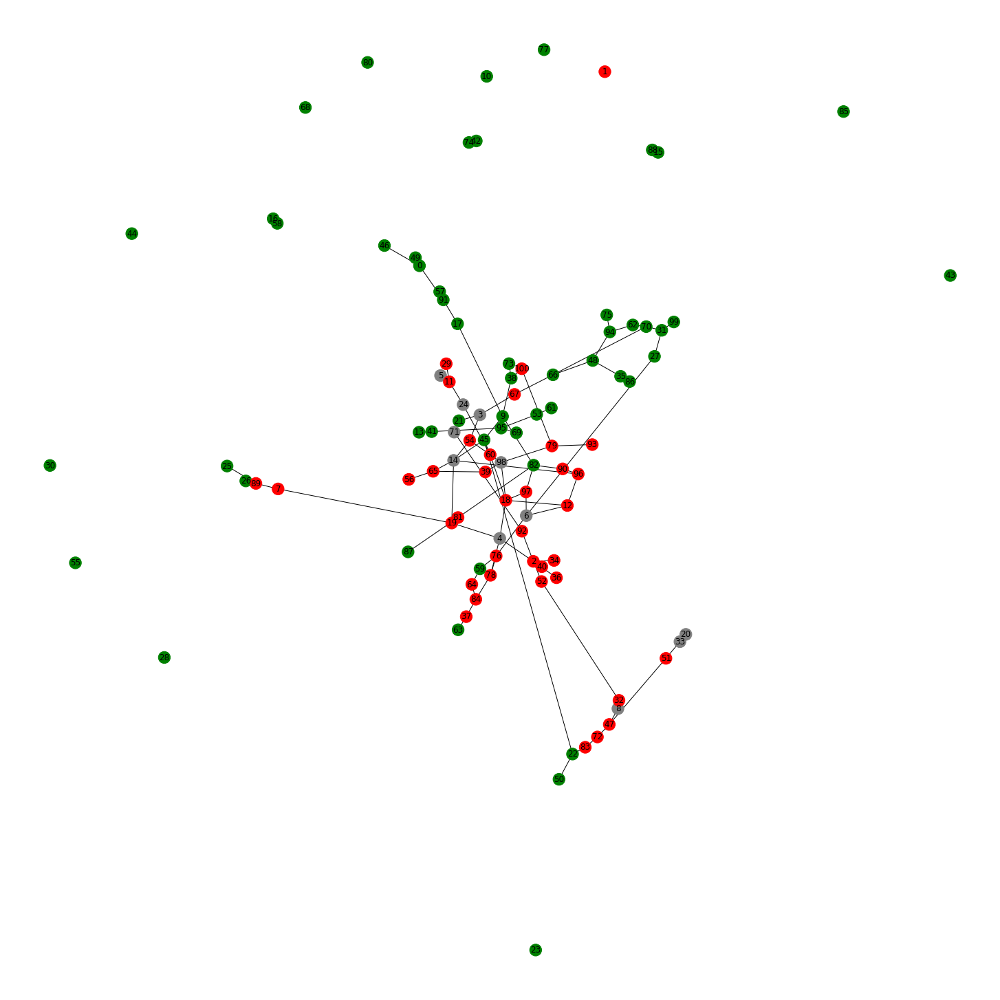

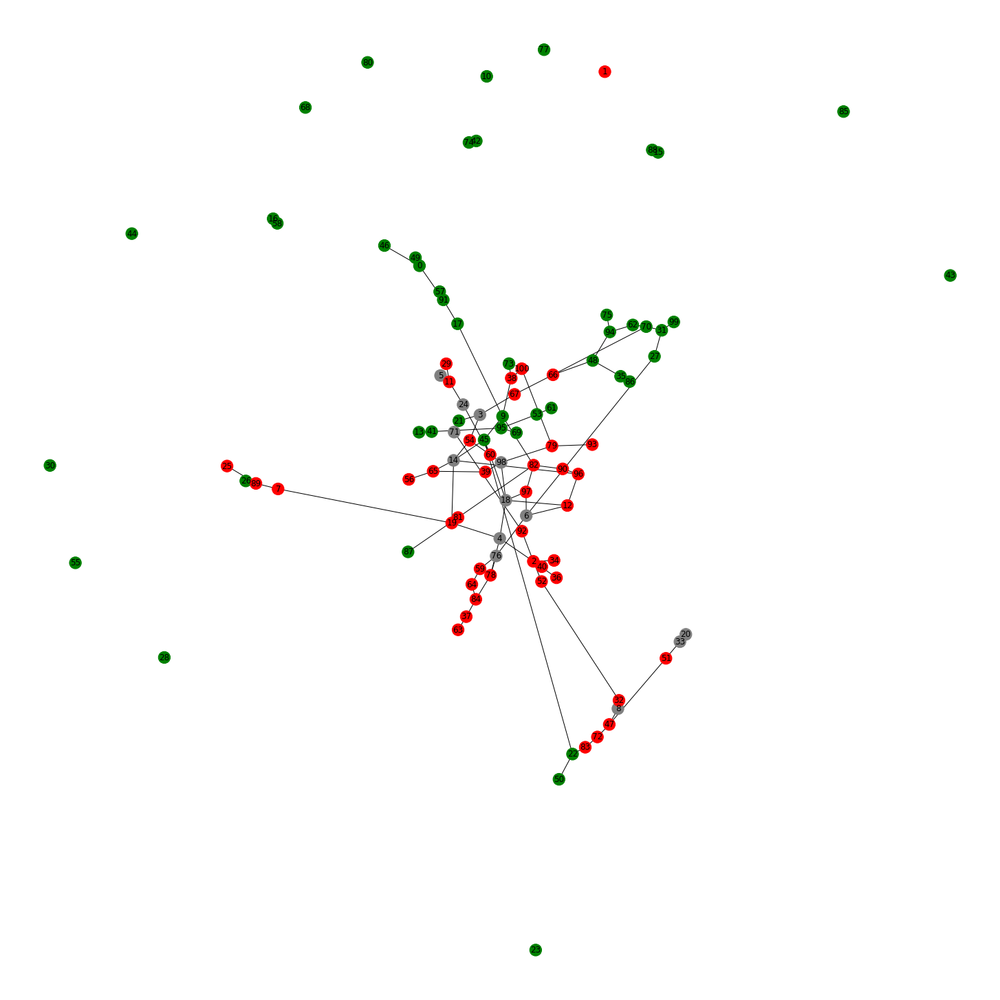

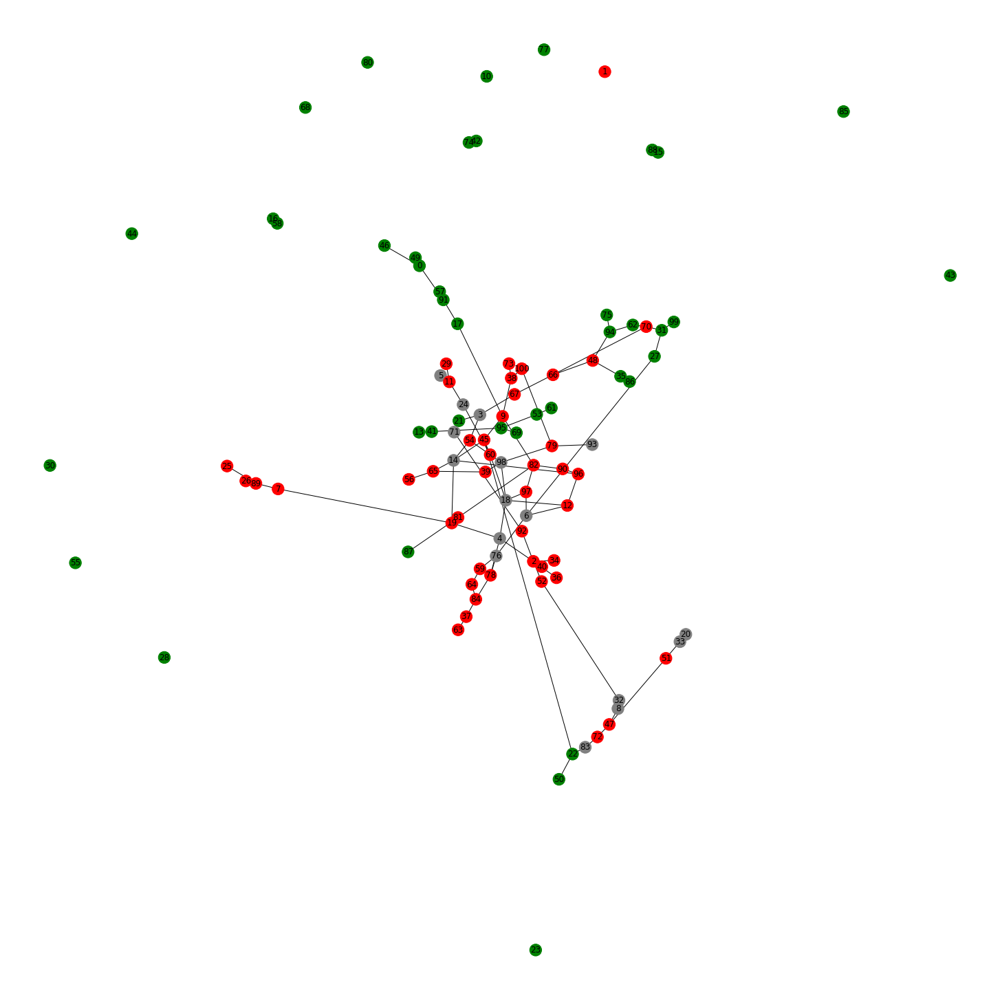

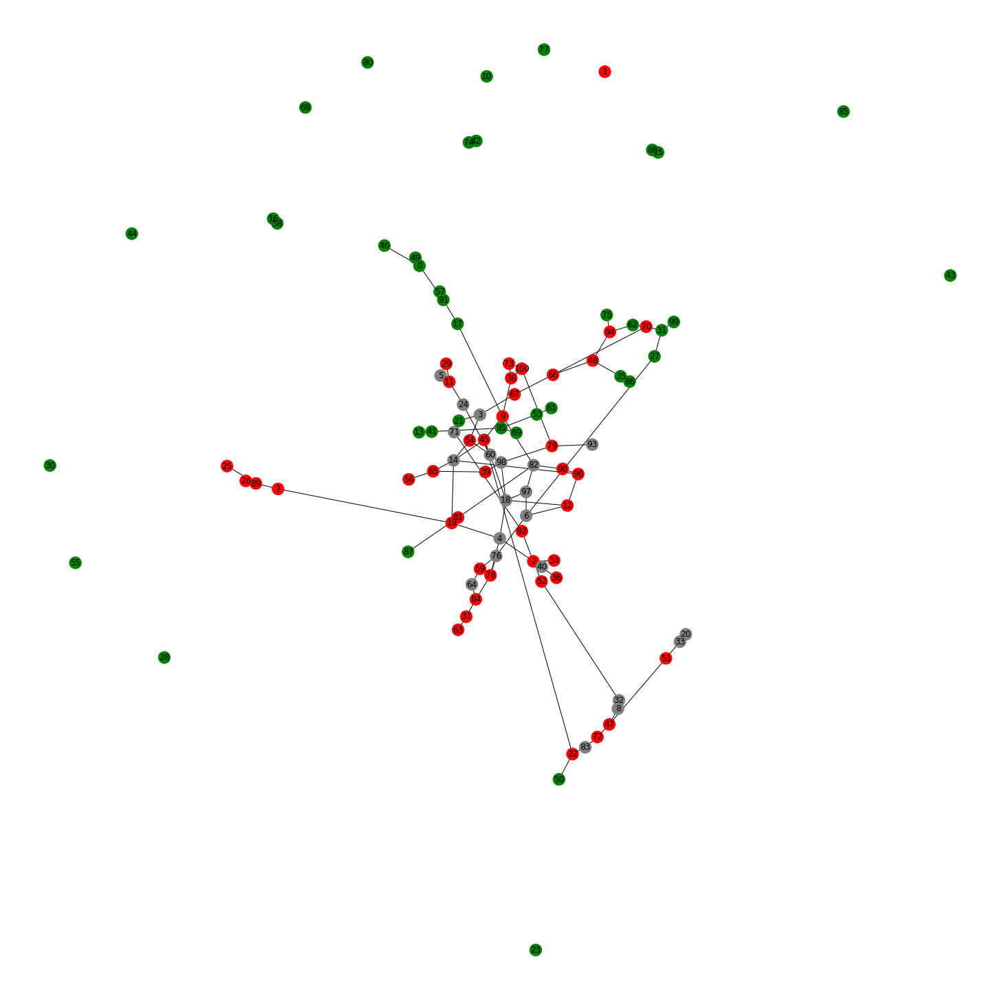

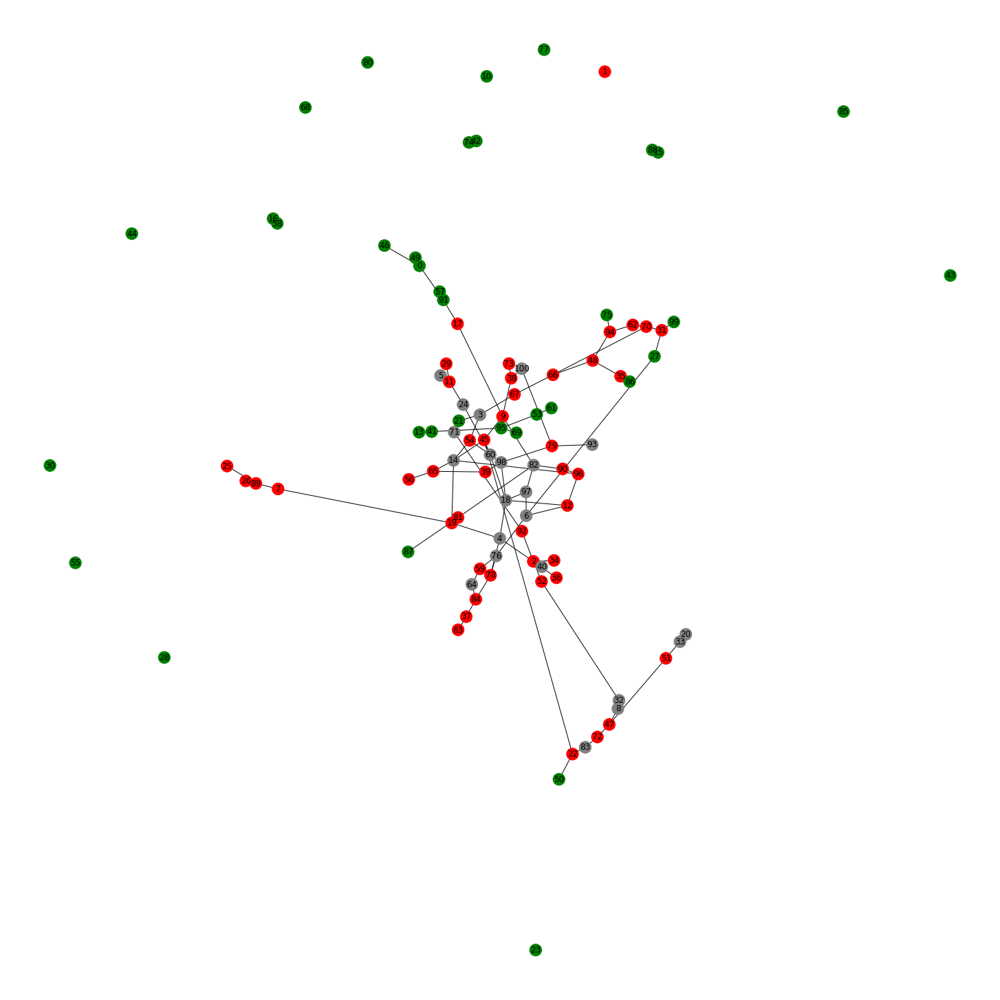

In [281]:
import networkx as nx
import matplotlib.pyplot as plt
from fa2l import force_atlas2_layout
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep

#g = nx.les_miserables_graph()
g = nx.karate_club_graph()

# Prepare node positions for output
positions = force_atlas2_layout(G1,
                                iterations=100,
                                pos_list=None,
                                node_masses=None,
                                outbound_attraction_distribution=False,
                                lin_log_mode=False,
                                prevent_overlapping=False,
                                edge_weight_influence=1.0,

                                jitter_tolerance=1.0,
                                barnes_hut_optimize=True,
                                barnes_hut_theta=0.5,

                                scaling_ratio=2.0,
                                strong_gravity_mode=False,
                                multithread=False,
                                gravity=1.0)

# Model selection
model = ep.SIRModel(G1)

# Model Configuration
cfg = mc.Configuration()
cfg.add_model_parameter('beta', 0.5)
cfg.add_model_parameter('gamma', 0.1)
cfg.add_model_parameter("fraction_infected", 0.05)
model.set_initial_status(cfg)

number_of_iteration = 10
# Simulation execution
iterations = model.iteration_bunch(number_of_iteration)

color_map = []
for iteration in range(G1.number_of_nodes()):
    color_map.append('green')

for iteration in iterations:
    for index, status in iteration['status'].items():
        if status == 1:
            color_map[index] = 'red'
        if status == 2:
            color_map[index] = 'grey'
    plt.figure(figsize=(20,20))
    nx.draw(G1, positions, node_color=color_map, with_labels=True)
    plt.show()

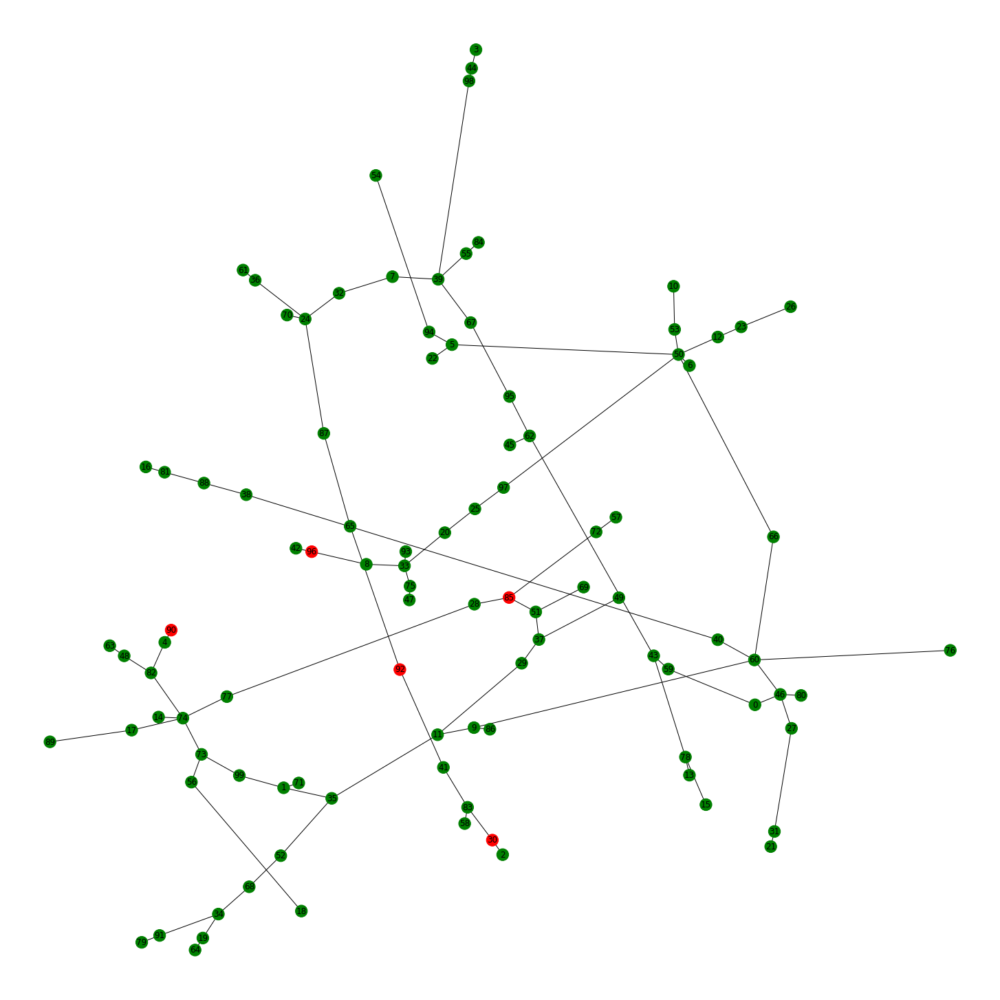

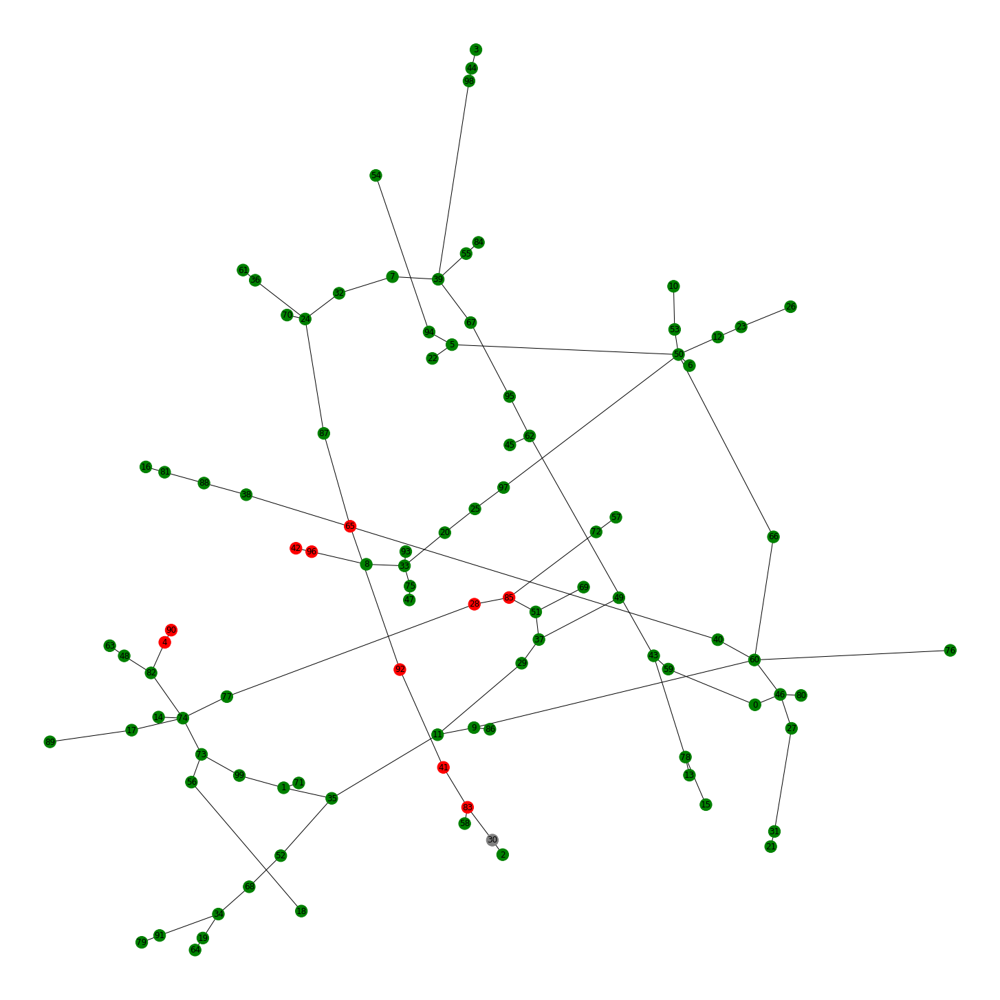

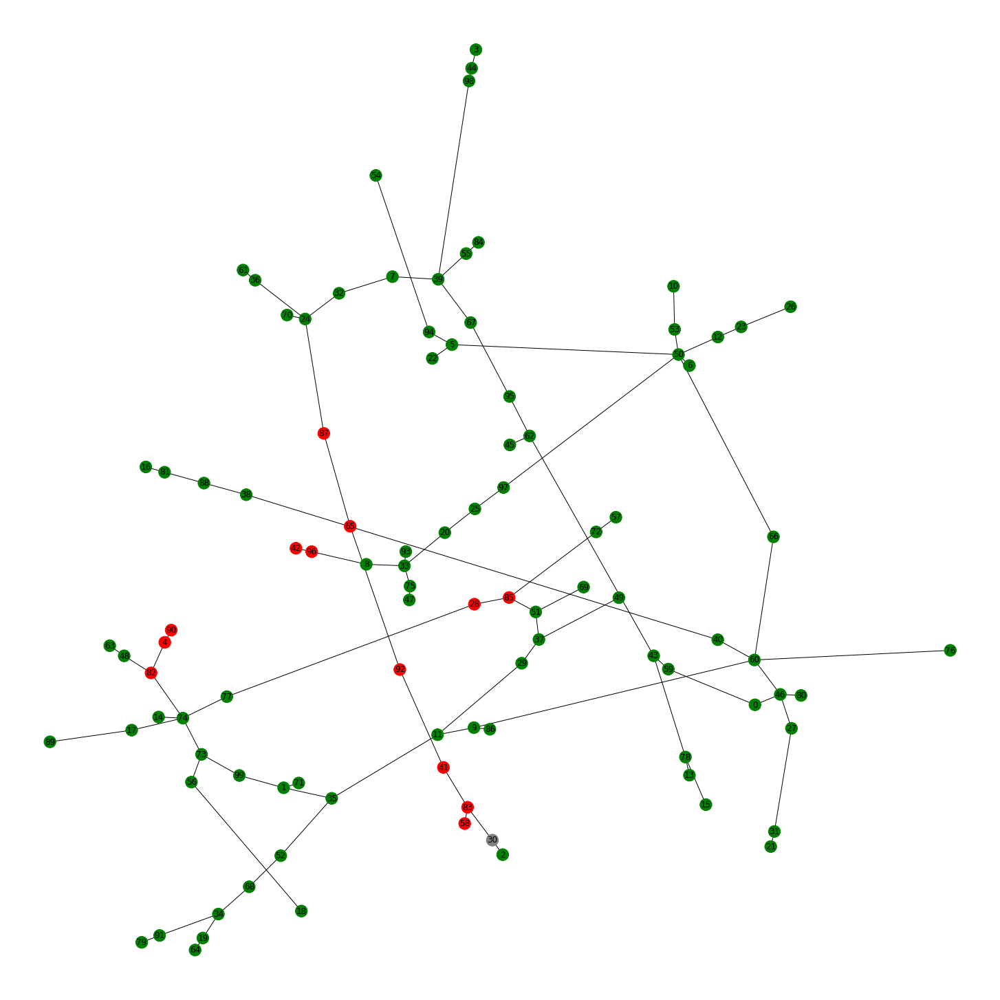

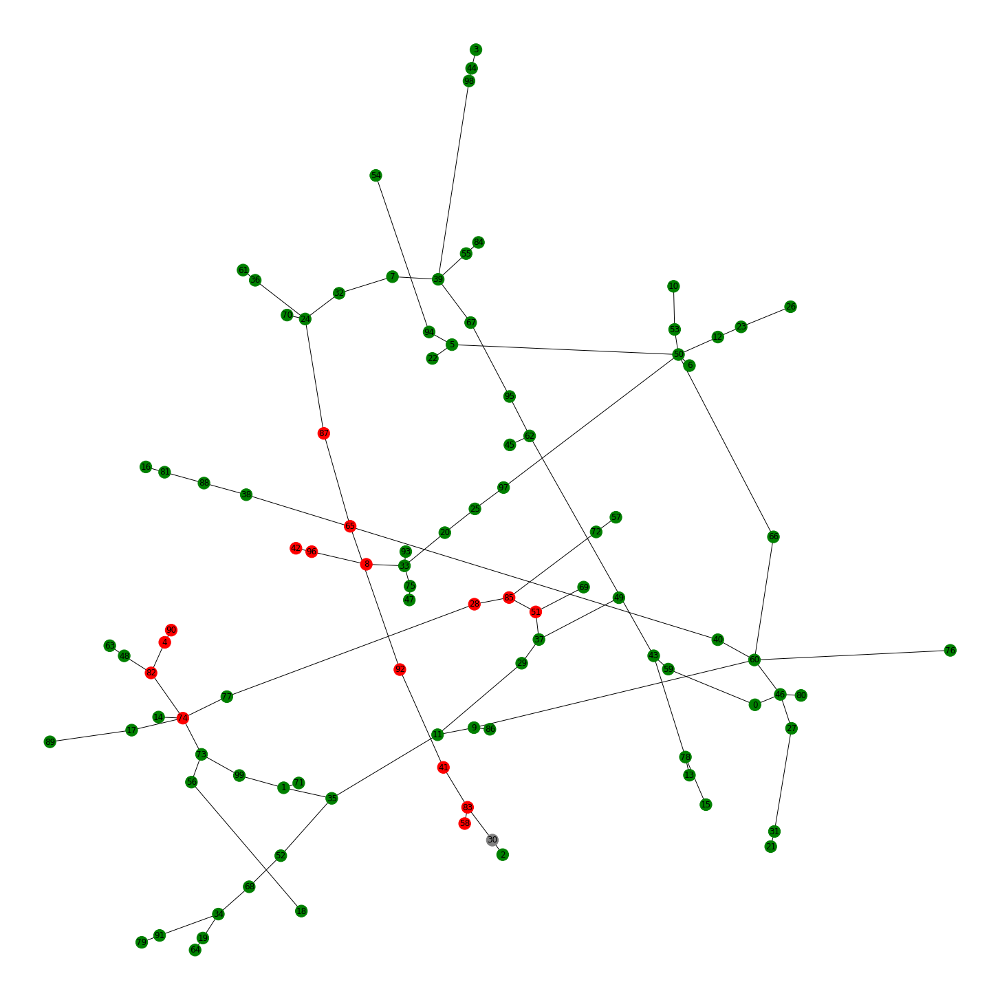

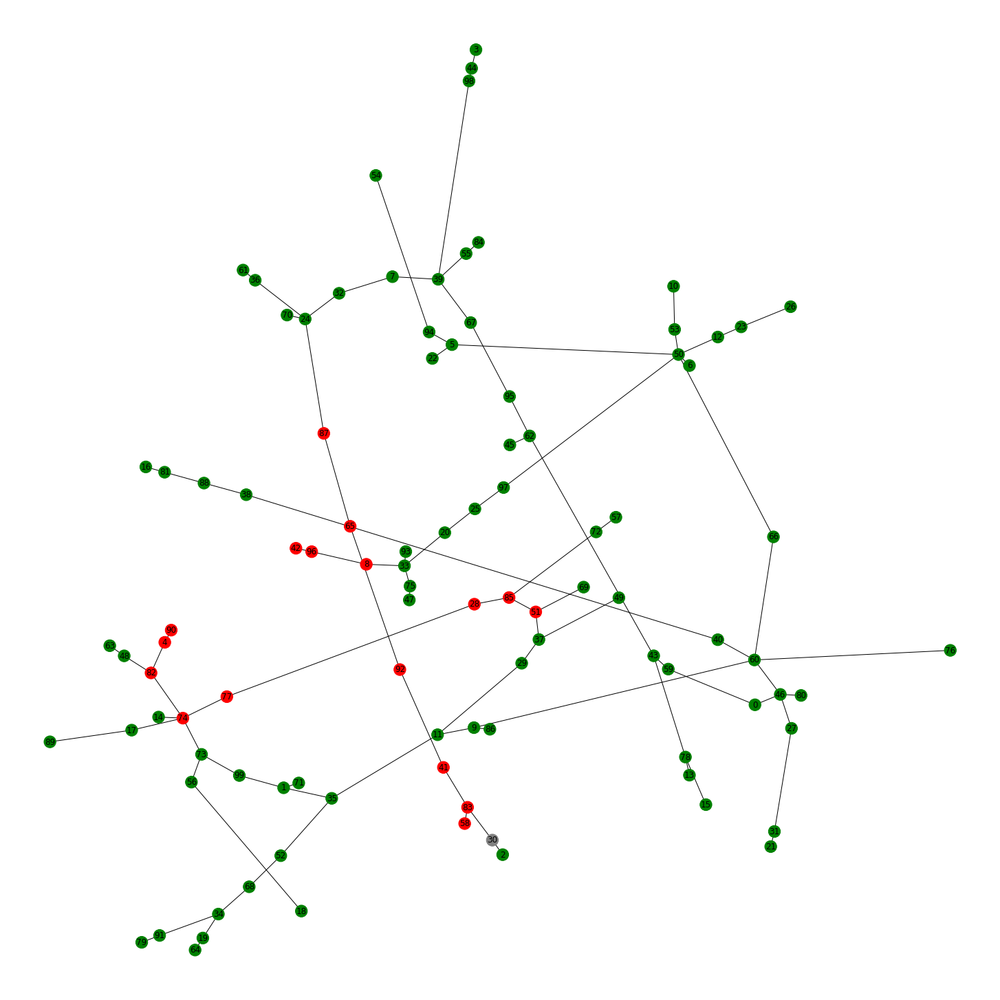

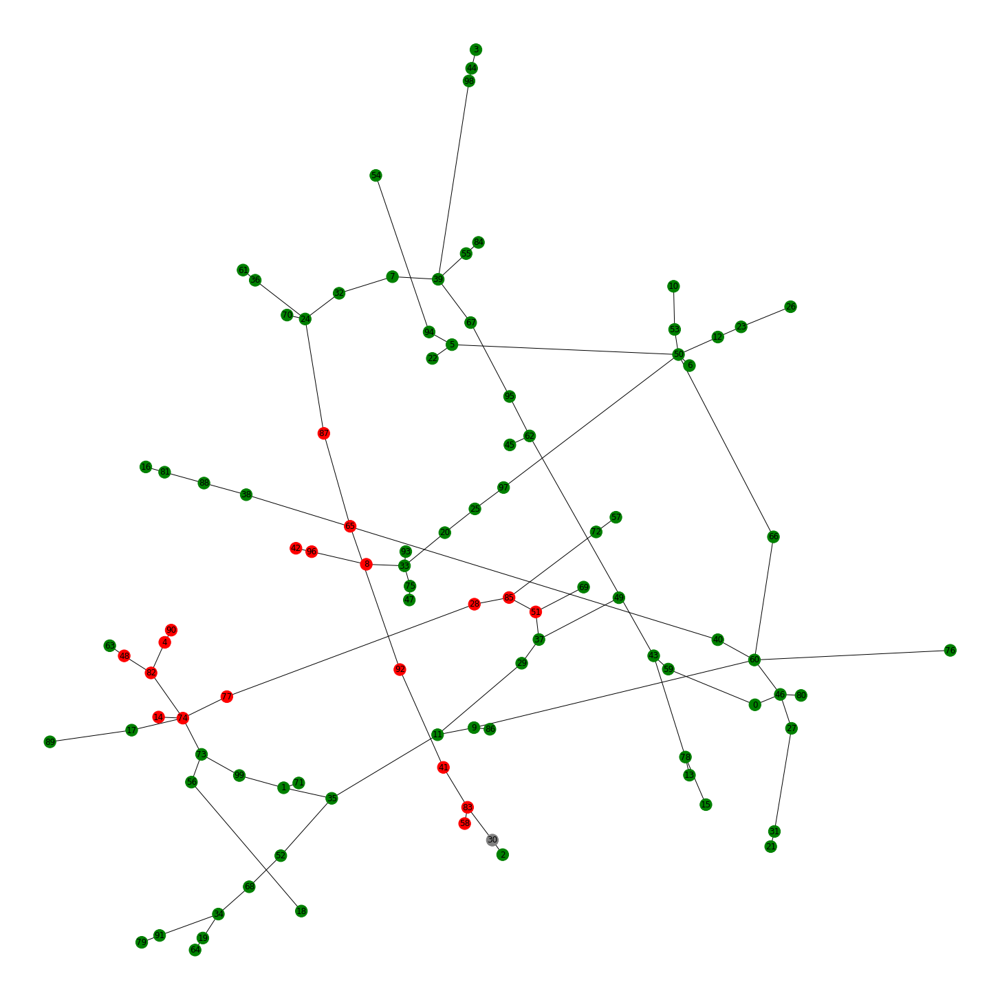

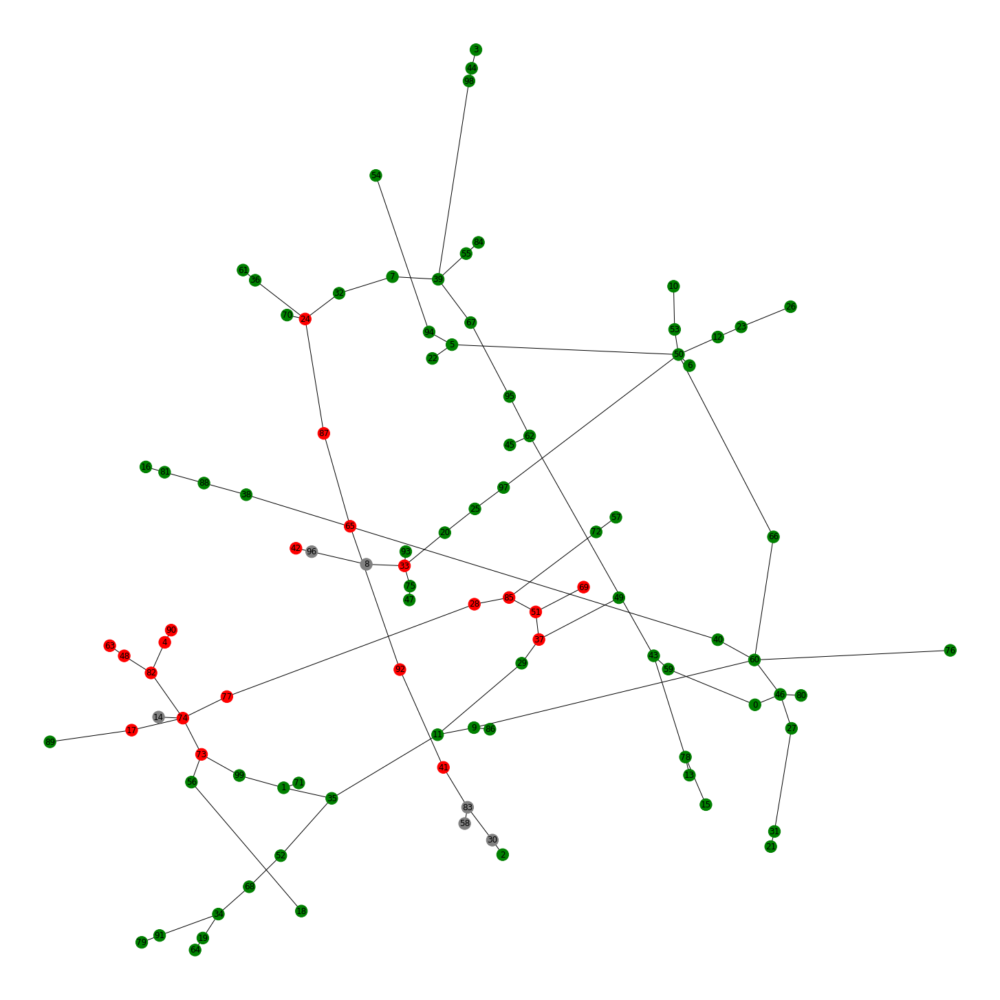

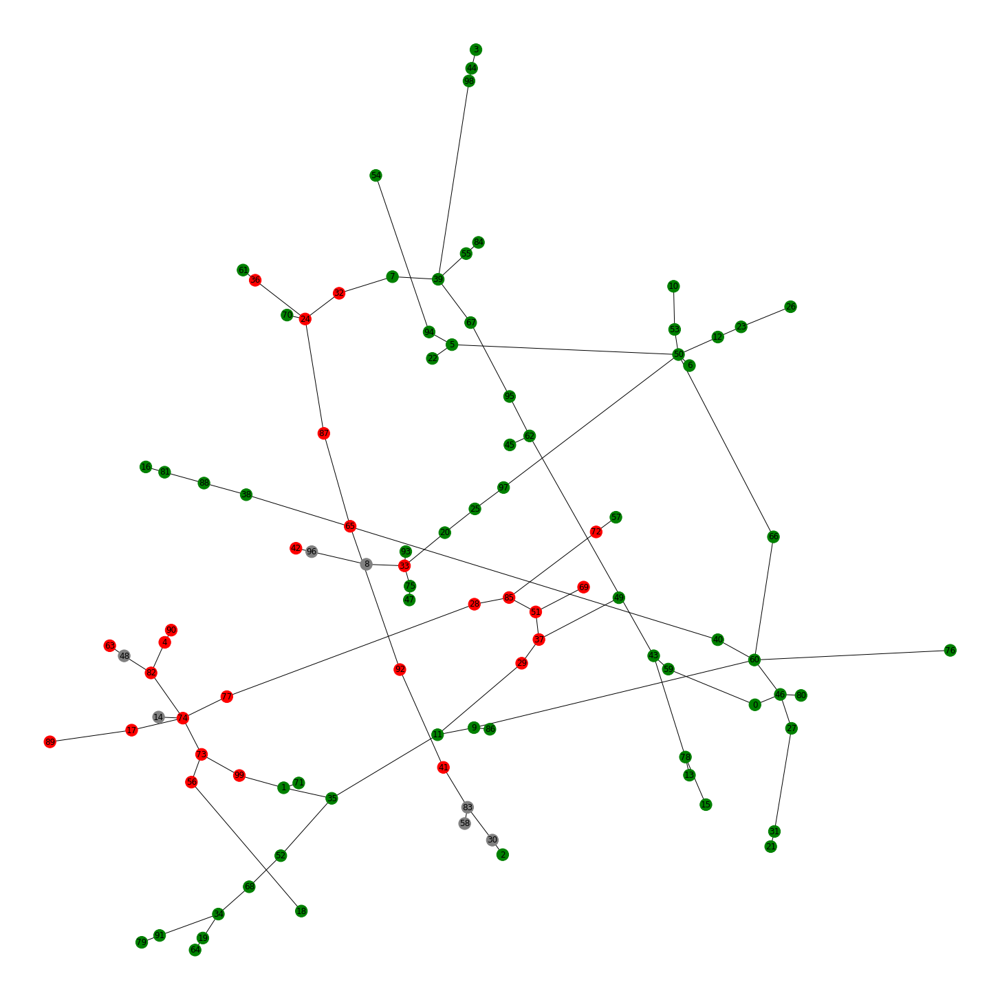

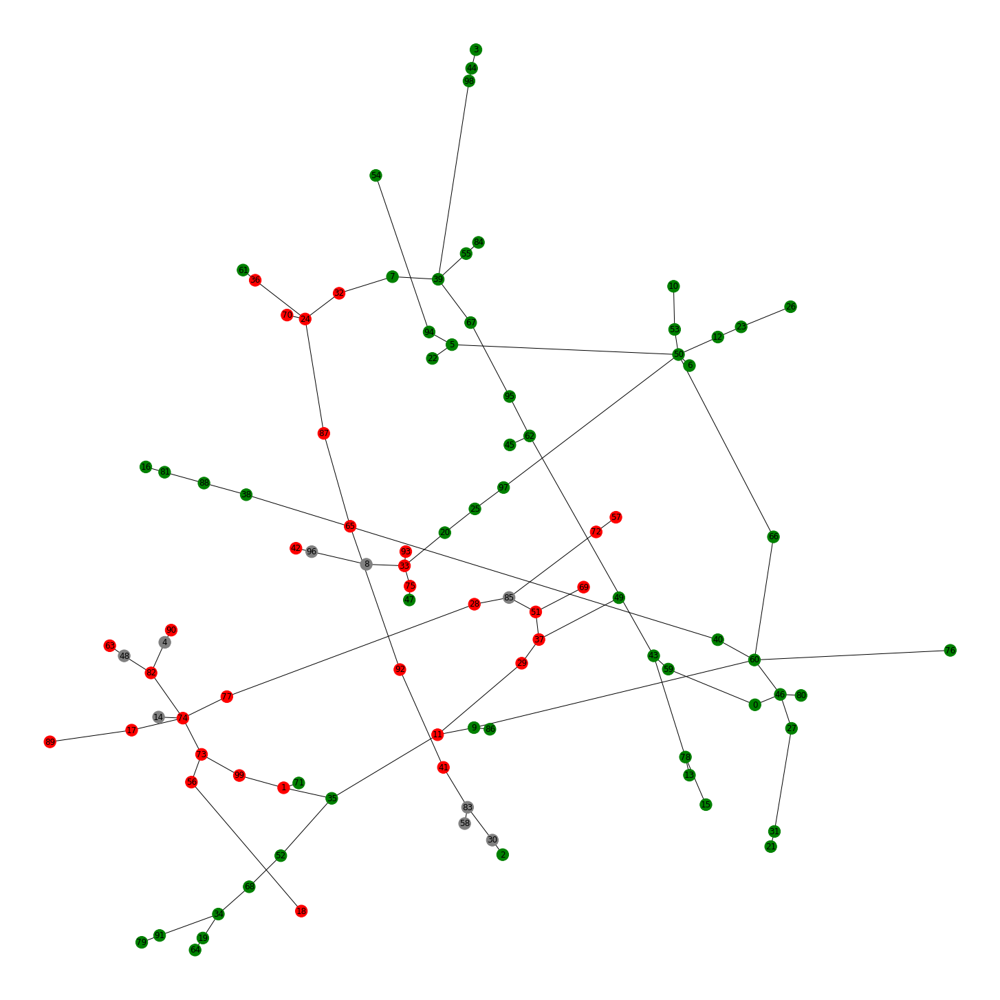

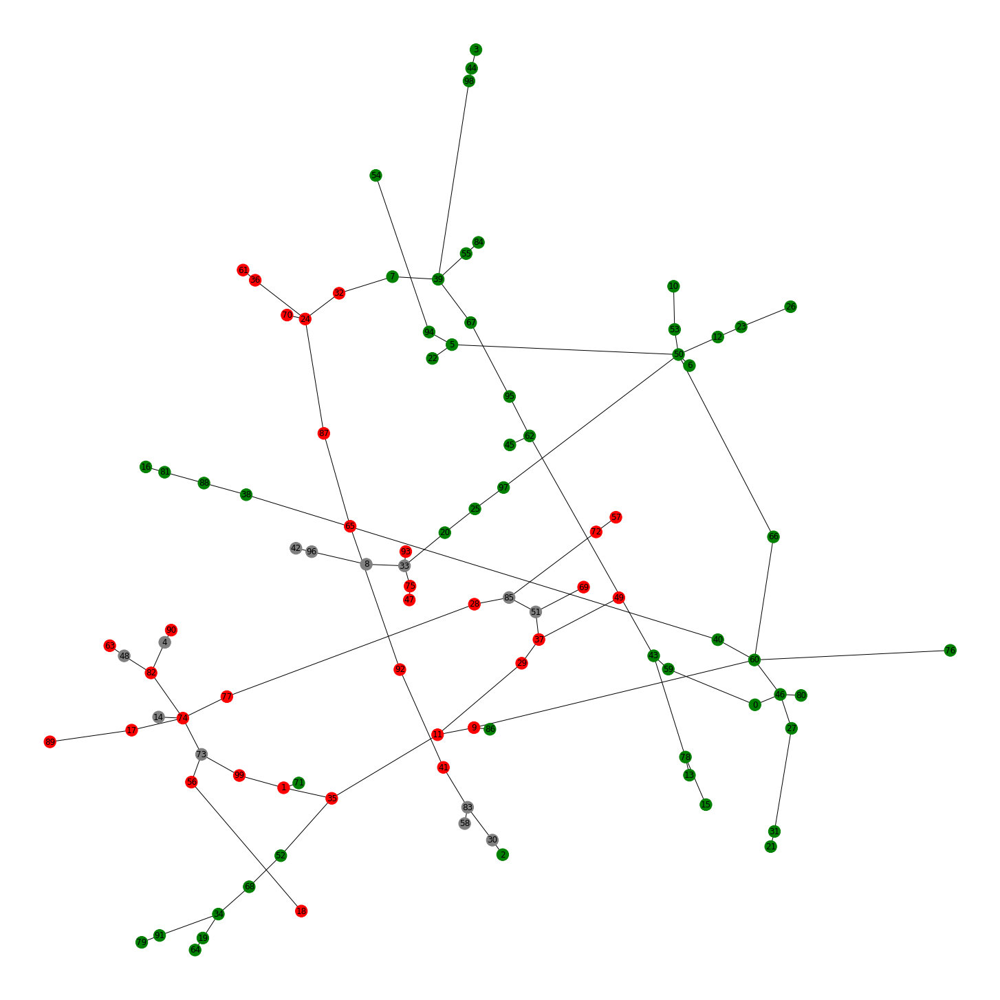

In [282]:
import networkx as nx
import matplotlib.pyplot as plt
from fa2l import force_atlas2_layout
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep

#g = nx.les_miserables_graph()
g = nx.karate_club_graph()

# Prepare node positions for output
positions = force_atlas2_layout(G2,
                                iterations=100,
                                pos_list=None,
                                node_masses=None,
                                outbound_attraction_distribution=False,
                                lin_log_mode=False,
                                prevent_overlapping=False,
                                edge_weight_influence=1.0,

                                jitter_tolerance=1.0,
                                barnes_hut_optimize=True,
                                barnes_hut_theta=0.5,

                                scaling_ratio=2.0,
                                strong_gravity_mode=False,
                                multithread=False,
                                gravity=1.0)

# Model selection
model = ep.SIRModel(G2)

# Model Configuration
cfg = mc.Configuration()
cfg.add_model_parameter('beta', 0.5)
cfg.add_model_parameter('gamma', 0.1)
cfg.add_model_parameter("fraction_infected", 0.05)
model.set_initial_status(cfg)

number_of_iteration = 10
# Simulation execution
iterations = model.iteration_bunch(number_of_iteration)

color_map = []
for iteration in range(G2.number_of_nodes()):
    color_map.append('green')

for iteration in iterations:
    for index, status in iteration['status'].items():
        if status == 1:
            color_map[index] = 'red'
        if status == 2:
            color_map[index] = 'grey'

    plt.figure(figsize=(20,20))
    nx.draw(G2, positions, node_color=color_map, with_labels=True)
    
    plt.show()